# 📚 Book Recommendation System

### 👨‍💻 Presented by: Mohamed Ali Kamoun & Oussema Feki

---

## 🧠 Project Overview

In this project, we aim to develop an intelligent **Book Recommendation System** by integrating both textual and visual data from two distinct datasets:

- **📦 Amazon Data Science Books Dataset**: A structured dataset (CSV file) containing detailed metadata about books, including 19 columns such as `title`, `author`, `language`, `publisher`, `avg_reviews`, `mean_rating`, `n_reviews`, `price`, and more.
  
- **🖼️ Book Covers of Amazon Data - AI Books**: A dataset containing cover images of AI and data science-related books, used to extract visual features for recommendation purposes.

---

## 🎯 Objective

The main goal of this project is to build and deploy a **real-time, intelligent book recommendation model** that:

- Understands user queries (e.g., based on interest or keyword like "machine learning").
- Retrieves and recommends relevant books based on both **textual metadata** and, optionally, **visual similarity** from book covers.
- Integrates seamlessly into an interactive and user-friendly **desktop application** using **Streamlit**.

---

## 🚀 Deployment

At the final stage, we deployed our machine learning model in a **desktop application** using **Streamlit**, providing users with real-time book recommendations based on their interests. The app processes user input and dynamically displays recommended books with all relevant information and links.

---

## 🌍 Scalability & Real-World Use Cases

This project is highly scalable and its methodology can be extended to other domains beyond books, such as:

- 🎬 **Netflix**: Personalized movie or TV series recommendations based on viewing behavior and content metadata.
- 🛍️ **Amazon or eBay**: Product recommendation systems integrating images and reviews.
- 📱 **Facebook / Instagram**: Content or friend recommendation engines using hybrid data (text, images, metadata).

With additional fine-tuning and data, the underlying architecture can serve as a foundation for **multi-modal recommendation engines** across various industries.

---

> ✅ This project showcases the power of combining structured data with natural language processing and real-time deployment techniques for delivering intelligent, scalable solutions.


## 🛠️ Step 1: Data Loading and Image Matching

In this section, we begin by loading and preparing the data necessary for building our book recommendation system. The process includes:

### 📥 1. Loading the Dataset
We load the **Amazon Data Science Books Dataset** from a CSV file, which contains metadata for various data science and AI-related books. The dataset includes fields such as `title`, `author`, `price`, `pages`, `avg_reviews`, and more.


In [1]:
# Step 1: Imports
import pandas as pd
import os
import difflib

# Load CSV file
df = pd.read_csv('final_book_dataset_kaggle.csv')

# Preview dataset
df[['title', 'link']].head()


,title,link
0,Data Analysis Using R (Low Priced Edition): A ...,/Data-Analysis-Using-Low-Priced/dp/1685549594/...
1,Head First Data Analysis: A learner's guide to...,/Head-First-Data-Analysis-statistics/dp/059615...
2,Guerrilla Data Analysis Using Microsoft Excel:...,/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1...
3,Python for Data Analysis: Data Wrangling with ...,/Python-Data-Analysis-Wrangling-IPython/dp/149...
4,Excel Data Analysis For Dummies (For Dummies (...,/Excel-Data-Analysis-Dummies-Computer/dp/11198...


In [2]:
# Step 2: List image filenames from the image dataset
image_dir = 'Book Covers of Amazon Data & AI Books'
image_files = os.listdir(image_dir)

# Clean image names (remove extensions and replace underscores with spaces)
image_names = [os.path.splitext(f)[0].replace('_', ' ').lower() for f in image_files]
image_name_map = {name: f for name, f in zip(image_names, image_files)}


## 🔄 Why We Need to Match Titles to Images

### ⚠️ The Challenge: Inconsistent Naming from Web Scraping

The two datasets we are using were **extracted separately via web scraping**, which leads to a critical issue:

- The **CSV dataset** contains **book metadata** (titles, authors, etc.).
- The **image dataset** contains only **book cover images**, with filenames based on titles.

However, **these titles and filenames don't exactly match** due to:
- Differences in casing (e.g., uppercase vs. lowercase)
- Underscores (`_`) used instead of spaces in image filenames
- Missing or extra characters in scraped titles
- Typos or formatting inconsistencies

Because of this, we **cannot directly join the datasets** using the book title as a key.

---

### 🧩 The Solution: Fuzzy Matching & Normalization

To solve this, we:
1. **Normalize** the image filenames by:
   - Removing file extensions (e.g., `.jpg`, `.png`)
   - Replacing underscores with spaces
   - Converting to lowercase

2. Use **fuzzy string matching** (via the `difflib` library) to find the closest image filename that resembles each book title.

3. Create a new column in the DataFrame called `matched_image` that stores the corresponding image file for each book.

---

### ✅ Result

This preprocessing step allows us to create a **clean and consistent dataset** where:
- Each book in the CSV is now linked to its correct **cover image**
- We can display metadata and visuals together in the recommendation system

> 📌 This is a crucial step for building a hybrid model that leverages both text and image features for intelligent book recommendations.

In [3]:
# Step 3: Match each book to the closest image filename using title
def match_title_to_image(title):
    if pd.isna(title):
        return None
    title_clean = title.lower()
    match = difflib.get_close_matches(title_clean, image_names, n=1, cutoff=0.6)
    if match:
        return image_name_map[match[0]]
    return None

# Create new column in DataFrame
df['matched_image'] = df['title'].apply(match_title_to_image)

# Preview the result
df[['title', 'matched_image']].head(10)


,title,matched_image
0,Data Analysis Using R (Low Priced Edition): A ...,None
1,Head First Data Analysis: A learner's guide to...,None
2,Guerrilla Data Analysis Using Microsoft Excel:...,guerrilla_data_analysis_using_microsoft_excel_...
3,Python for Data Analysis: Data Wrangling with ...,python_for_data_analysis_data_wrangling_with_p...
4,Excel Data Analysis For Dummies (For Dummies (...,excel_data_analysis_for_dummies_for_dummies_co...
5,Everything Data Analytics: A Beginner's Guide ...,None
6,SQL for Data Analysis: Advanced Techniques for...,sql_for_data_analysis_advanced_techniques_for_...
7,Qualitative Data Analysis: A Methods Sourcebook,qualitative_data_analysis_a_methods_sourcebook...
8,Topological Data Analysis with Applications,topological_data_analysis_with_applications.jpg
9,"R in Action, Third Edition: Data analysis and ...",r_in_action_third_edition_data_analysis_and_gr...


In [4]:
df.head()

,title,author,price,price (including used books),pages,avg_reviews,n_reviews,star5,star4,star3,star2,star1,dimensions,weight,language,publisher,ISBN_13,link,complete_link,matched_image
0,Data Analysis Using R (Low Priced Edition): A ...,[ Dr Dhaval Maheta],6.75,6.75,500,4.4,23,55%,39%,6%,NaN,NaN,8.5 x 1.01 x 11 inches,2.53 pounds,English,"Notion Press Media Pvt Ltd (November 22, 2021)",978-1685549596,/Data-Analysis-Using-Low-Priced/dp/1685549594/...,https://www.amazon.com/Data-Analysis-Using-Low...,None
1,Head First Data Analysis: A learner's guide to...,NaN,33.72,21.49 - 33.72,484,4.3,124,61%,20%,9%,4%,6%,8 x 0.98 x 9.25 inches,1.96 pounds,English,"O'Reilly Media; 1st edition (August 18, 2009)",978-0596153939,/Head-First-Data-Analysis-statistics/dp/059615...,https://www.amazon.com/Head-First-Data-Analysi...,None
2,Guerrilla Data Analysis Using Microsoft Excel:...,"[ Oz du Soleil, and , Bill Jelen]",32.07,32.07,274,4.7,10,87%,13%,NaN,NaN,NaN,8.25 x 0.6 x 10.75 inches,1.4 pounds,English,"Holy Macro! Books; Third edition (August 1, 2022)",978-1615470747,/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1...,https://www.amazon.com/Guerrilla-Analysis-Usin...,guerrilla_data_analysis_using_microsoft_excel_...
3,Python for Data Analysis: Data Wrangling with ...,[ William McKinney],53.99,53.99,547,4.6,"1,686",75%,16%,5%,2%,2%,7 x 1.11 x 9.19 inches,1.47 pounds,English,"O'Reilly Media; 2nd edition (November 14, 2017)",978-1491957660,/Python-Data-Analysis-Wrangling-IPython/dp/149...,https://www.amazon.com/Python-Data-Analysis-Wr...,python_for_data_analysis_data_wrangling_with_p...
4,Excel Data Analysis For Dummies (For Dummies (...,[ Paul McFedries],24.49,24.49,368,3.9,12,52%,17%,10%,10%,10%,7.38 x 0.83 x 9.25 inches,1.3 pounds,English,"For Dummies; 5th edition (February 3, 2022)",978-1119844426,/Excel-Data-Analysis-Dummies-Computer/dp/11198...,https://www.amazon.com/Excel-Data-Analysis-Dum...,excel_data_analysis_for_dummies_for_dummies_co...


📘 Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes


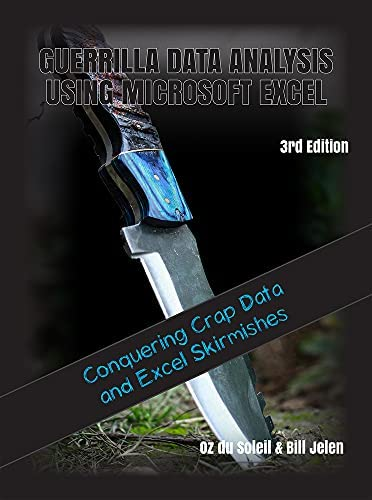

📘 Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython


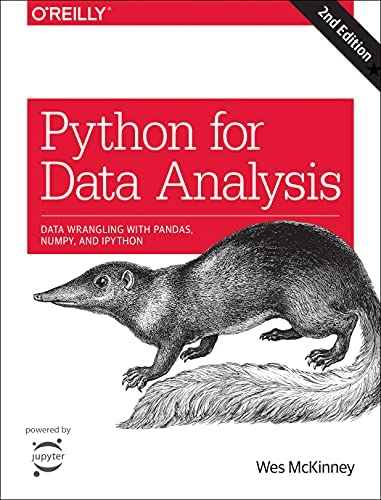

📘 Excel Data Analysis For Dummies (For Dummies (Computer/Tech))


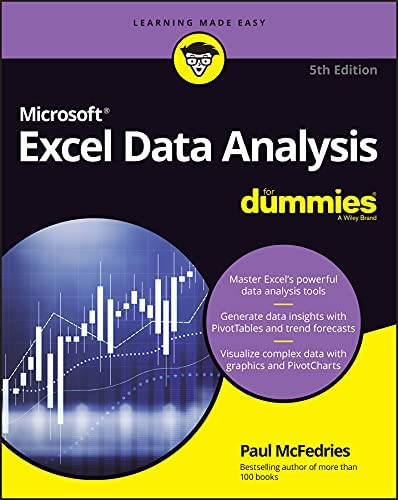

📘 SQL for Data Analysis: Advanced Techniques for Transforming Data into Insights


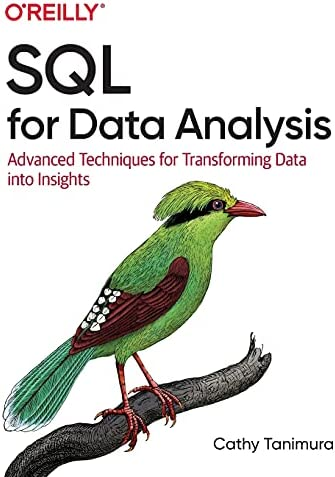

📘 Qualitative Data Analysis: A Methods Sourcebook


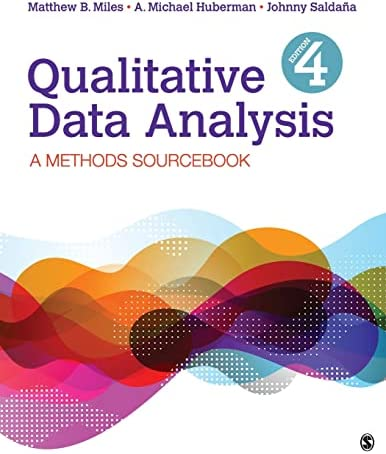

In [5]:
# Step 4: Show some matched images
from IPython.display import Image, display

for _, row in df[['title', 'matched_image']].dropna().head(5).iterrows():
    print(f"📘 {row['title']}")
    image_path = os.path.join(image_dir, row['matched_image'])
    display(Image(filename=image_path))


In [6]:
# Drop rows where 'matched_image' is None
df = df.dropna(subset=['matched_image'])

# Show the number of remaining rows
print(f"Number of rows with a matched image: {len(df)}")

# Preview the result
df[['title', 'matched_image']].head(10)

Number of rows with a matched image: 373


,title,matched_image
2,Guerrilla Data Analysis Using Microsoft Excel:...,guerrilla_data_analysis_using_microsoft_excel_...
3,Python for Data Analysis: Data Wrangling with ...,python_for_data_analysis_data_wrangling_with_p...
4,Excel Data Analysis For Dummies (For Dummies (...,excel_data_analysis_for_dummies_for_dummies_co...
6,SQL for Data Analysis: Advanced Techniques for...,sql_for_data_analysis_advanced_techniques_for_...
7,Qualitative Data Analysis: A Methods Sourcebook,qualitative_data_analysis_a_methods_sourcebook...
8,Topological Data Analysis with Applications,topological_data_analysis_with_applications.jpg
9,"R in Action, Third Edition: Data analysis and ...",r_in_action_third_edition_data_analysis_and_gr...
11,SQL for Data Analytics: Perform efficient and ...,sql_for_data_analytics_perform_fast_and_effici...
12,Python for Beginners: 2 Books in 1: The Perfec...,python_programming_3_books_in_1_the_complete_b...
21,Think Bayes: Bayesian Statistics in Python (O'...,think_bayes_bayesian_statistics_in_python_orei...


## 🧹 Data Cleaning and Missing Value Handling

To prepare the dataset for building a reliable and robust book recommendation system, we applied several data preprocessing steps, especially focused on cleaning and imputing **missing values**. Since the datasets were obtained via web scraping, inconsistencies and incomplete data were expected.

---

df.describe()

In [7]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from matplotlib.colors import LinearSegmentedColormap

In [8]:
df.shape

(373, 20)

In [9]:
df.isnull().sum()

title                             0
author                           41
price                            28
price (including used books)     28
pages                            21
avg_reviews                      28
n_reviews                        28
star5                            28
star4                            50
star3                            81
star2                           119
star1                           193
dimensions                       50
weight                           45
language                         18
publisher                        26
ISBN_13                          42
link                              0
complete_link                     0
matched_image                     0
dtype: int64

In [10]:
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 373 entries, 2 to 829
Data columns (total 20 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   title                         373 non-null    object 
 1   author                        332 non-null    object 
 2   price                         345 non-null    float64
 3   price (including used books)  345 non-null    object 
 4   pages                         352 non-null    object 
 5   avg_reviews                   345 non-null    float64
 6   n_reviews                     345 non-null    object 
 7   star5                         345 non-null    object 
 8   star4                         323 non-null    object 
 9   star3                         292 non-null    object 
 10  star2                         254 non-null    object 
 11  star1                         180 non-null    object 
 12  dimensions                    323 non-null    object 
 13  weight    

In [11]:
df.describe()

,price,avg_reviews
count,345.000000,345.000000
mean,47.897304,4.474203
std,30.816559,0.385570
min,0.990000,1.000000
25%,29.240000,4.400000
50%,40.990000,4.500000
75%,55.180000,4.700000
max,250.630000,5.000000


In [12]:
# Check correlation between 'price', 'price (including used books)', and 'pages'
corr_matrix = df[['price', 'pages']].corr()
print(corr_matrix)


          price     pages
price  1.000000  0.343391
pages  0.343391  1.000000


In [13]:
import pandas as pd

# Assuming df is your DataFrame

# Step 1: Clean the 'pages' column and convert it to numeric, forcing errors to NaN
df['pages'] = pd.to_numeric(df['pages'], errors='coerce')

# Step 2: Fill missing values with the median of the column
df['pages'].fillna(df['pages'].median(), inplace=True)

In [14]:
# Drop the 'price (including used books)' column
df = df.drop(columns=['price (including used books)'])

In [15]:
import pandas as pd
from sklearn.impute import KNNImputer
from sklearn.preprocessing import StandardScaler

# 👇 This line is mandatory to enable IterativeImputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer


💰 price and avg_reviews Columns
These features were scaled and imputed using KNN Imputation to estimate missing values based on the most similar data points

In [16]:
from sklearn.preprocessing import StandardScaler
from sklearn.impute import KNNImputer

# Colonnes à traiter
cols = ['price', 'avg_reviews']

# Mise à l'échelle
scaler = StandardScaler()
scaled_data = scaler.fit_transform(df[cols])

# Application de KNNImputer (même si pas nécessaire ici)
knn_imputer = KNNImputer(n_neighbors=5)
knn_imputed = knn_imputer.fit_transform(scaled_data)

# Inverse scaling et remplacement
df[cols] = scaler.inverse_transform(knn_imputed)


⚖️ weight Column
The weight column had values in different formats like "1.2 pounds", so we:

Extracted the numeric part.

Predicted missing weights using a Linear Regression model trained on the pages column.




In [17]:
from sklearn.linear_model import LinearRegression
import numpy as np
import pandas as pd
# Supprimer les unités (comme 'pounds', 'kg', etc.) et convertir en float
df['weight'] = df['weight'].str.extract(r'([0-9.]+)').astype(float)

# Garder les lignes avec weight non nul pour entraîner le modèle
train_data = df[df['weight'].notnull() & df['pages'].notnull()]
test_data = df[df['weight'].isnull() & df['pages'].notnull()]

# Entraînement du modèle
model = LinearRegression()
model.fit(train_data[['pages']], train_data['weight'])

# Prédiction des poids manquants
df.loc[df['weight'].isnull() & df['pages'].notnull(), 'weight'] = model.predict(test_data[['pages']])

🌐 language Column 

To fill in missing languages, we used the langdetect package to detect the language from the title of the book:

In [18]:
pip install langdetect


Note: you may need to restart the kernel to use updated packages.



[notice] A new release of pip is available: 24.1.2 -> 25.0.1
[notice] To update, run: c:\users\user\appdata\local\programs\python\python38\python.exe -m pip install --upgrade pip


In [19]:
from langdetect import detect
import pandas as pd

# Fonction pour détecter la langue
def detect_language(title):
    try:
        return detect(title)
    except:
        return "unknown"

# Remplir les valeurs manquantes dans 'language' à partir de 'title'
df['language'] = df.apply(
    lambda row: detect_language(row['title']) if pd.isnull(row['language']) else row['language'],
    axis=1
)

In [20]:
# Pour les colonnes catégorielles ou texte
categorical_cols = ['dimensions', 'publisher', 'ISBN_13']
for col in categorical_cols:
    df[col].fillna("Unknown", inplace=True)

In [21]:
def clean_numeric_column(col):
    return (
        df[col]
        .astype(str)               # convertir en chaîne
        .str.replace('%', '')      # supprimer le %
        .str.replace(',', '')      # supprimer les virgules
        .astype(float)             # convertir en float
    )

numerical_cols = ['n_reviews', 'star5', 'star4', 'star3', 'star2', 'star1']
for col in numerical_cols:
    df[col] = clean_numeric_column(col)
    df[col].fillna(df[col].median(), inplace=True)


In [22]:
df['author'].fillna('unknown', inplace=True)

In [23]:
df.isnull().sum()

title            0
author           0
price            0
pages            0
avg_reviews      0
n_reviews        0
star5            0
star4            0
star3            0
star2            0
star1            0
dimensions       0
weight           0
language         0
publisher        0
ISBN_13          0
link             0
complete_link    0
matched_image    0
dtype: int64

## 📊 Data Visualization & Analysis Overview

This notebook provides an exploratory data analysis (EDA) of a dataset containing information about books, including their prices, star ratings, number of reviews, publishers, and more. The following sections describe the insights derived from the visualizations:

---

### 🔍 1. **Distribution of Key Numerical Features**
- **Individual Histograms**: Plotted for `price`, `n_reviews`, and each star level (`star1` to `star5`) to observe the frequency distribution.
- **Combined Histograms**:
  - Total star ratings (sum of all star levels).
  - Number of reviews.
  - Price distribution.

> 📌 *Helps understand data skewness, detect outliers, and see popularity distribution.*

---

### ⭐ 2. **Average Star Ratings**
- A **bar plot** shows the average count of ratings per star level across all books.
- Provides a high-level view of how users typically rate books.

> ✅ *Useful to detect general customer sentiment.*

---

### 📈 3. **Mean Star Rating vs Price**
- A **scatter plot** with a color gradient representing price.
- Shows the relationship between the **average star rating** (computed as a weighted average) and **book price**.

> 💡 *Helps explore whether higher-rated books are more expensive.*

---

### 🏆 4. **Top Books by Average Review Score**
- A **horizontal bar chart** showing top 20 books with the highest average reviews (`avg_reviews`).
- Numerical values annotated for clarity.

> 🌟 *Identifies standout books based on user satisfaction.*

---

### 📘 5. **Book with the Most Reviews**
- Identified and printed the title of the book that received the **maximum number of reviews**.

---

### 🔥 6. **Correlation Heatmap**
- Displays correlations between numerical variables such as `price`, `pages`, `n_reviews`, and star ratings.
- Upper triangle is masked to enhance readability.

> 📈 *Highlights strong or weak linear relationships.*

---

### 🏷️ 7. **Box Plot: Price by Top 5 Publishers**
- Shows the **price distribution** per publisher for the 5 publishers with the most books.
- Useful to compare pricing strategies.

> 💰 *Indicates if certain publishers consistently price higher/lower.*

---

### 📦 8. **Stacked Bar Chart: Rating Distribution for Top Reviewed Books**
- Percentage distribution of star ratings for the top 5 most reviewed books.
- Color-coded bars show the proportion of each rating level.

> 📊 *Reveals consistency or polarity in public opinion.*

---

### ❓ 9. **Price vs Reviews Scatter Plot**
- A simple scatter plot to check if **more expensive books receive more reviews**.

> ❗ *Evaluates if price influences popularity.*

---

### ✅ 10. **Books with More Than 100 Reviews**
- A filtered dataset (`n_reviews > 100`) was analyzed to:
  - Sort and display the most reviewed titles.
  - Find the book(s) with the lowest average review score (`avg_reviews`).

---


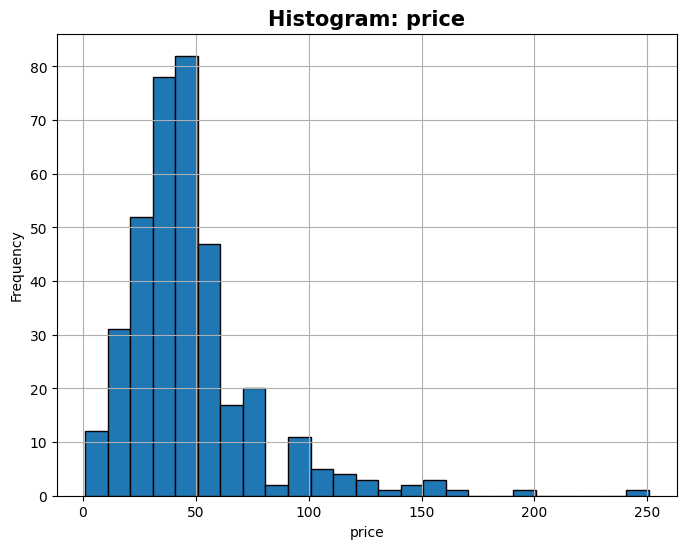

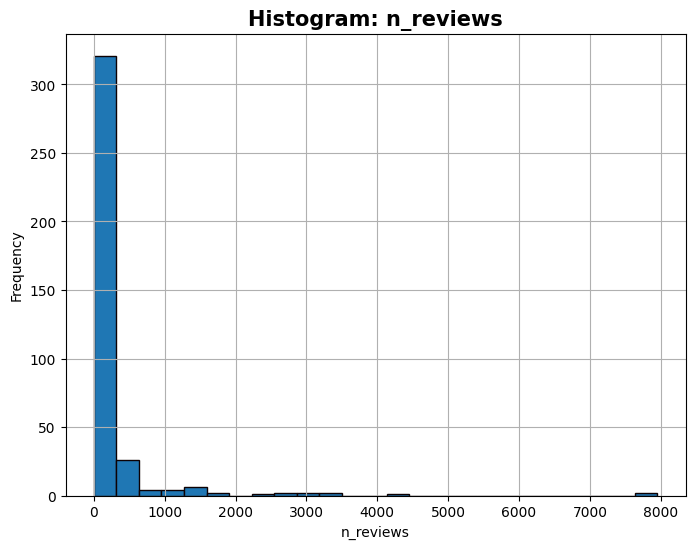

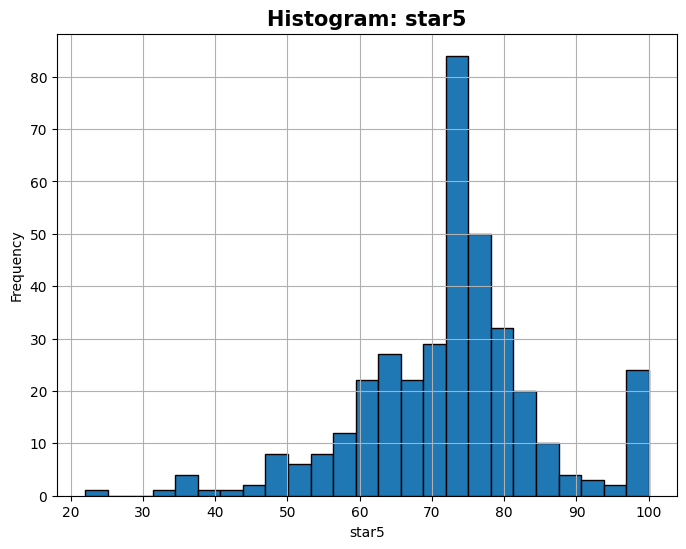

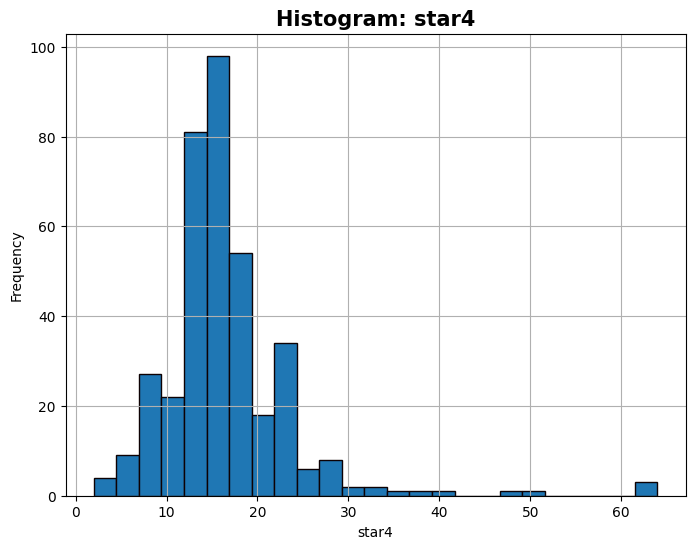

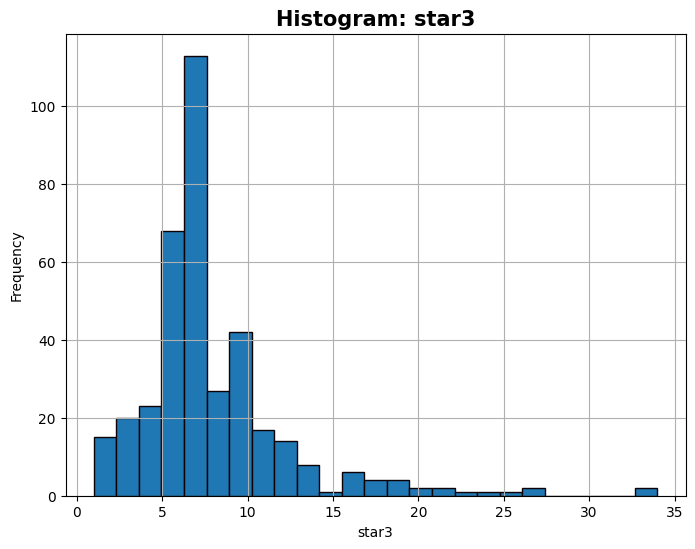

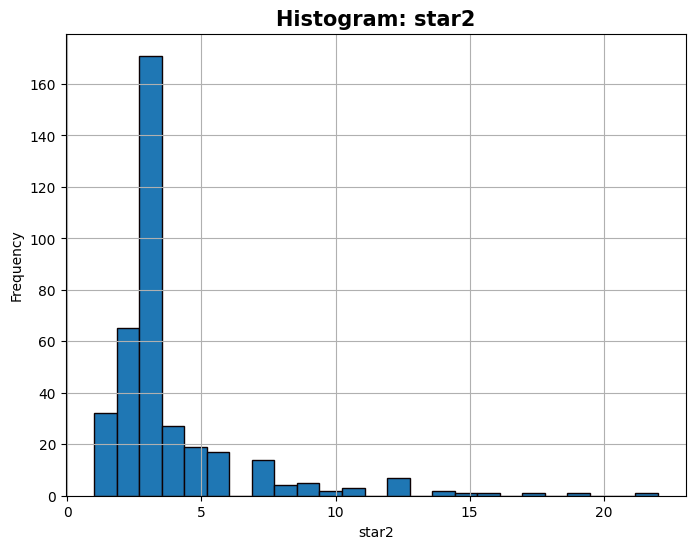

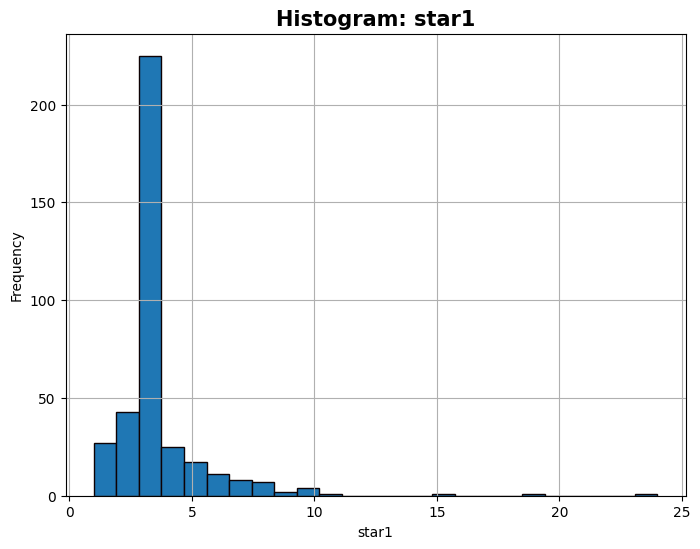

In [24]:
import matplotlib.pyplot as plt

# Sélectionner les colonnes numériques
columns = ['price', 'n_reviews', 'star5', 'star4', 'star3', 'star2', 'star1']

# Définir le nombre de bins
bins = 25

# Pour chaque colonne, créer un histogramme séparé
for col in columns:
    plt.figure(figsize=(8, 6))  # Créer une nouvelle figure pour chaque histogramme
    df[col].hist(bins=bins, edgecolor='#0d0103', linewidth=1)
    plt.title(f'Histogram: {col}', fontsize=15, fontweight='bold')
    plt.xlabel(col)
    plt.ylabel('Frequency')
    plt.show()  # Afficher le graphique


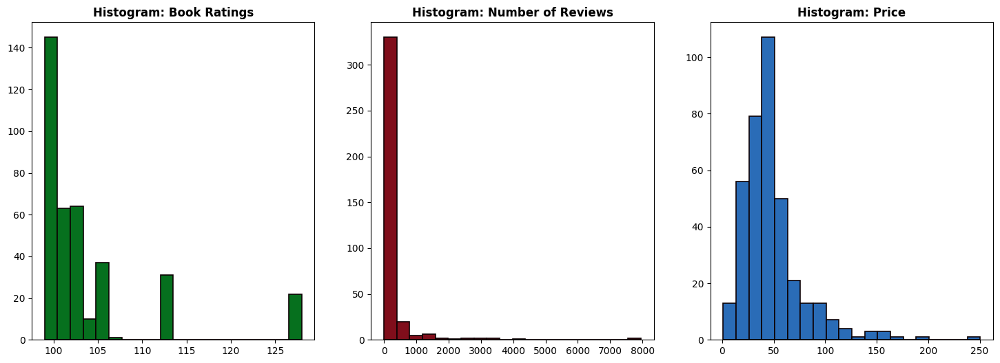

In [25]:
import matplotlib.pyplot as plt

# Sélectionner les colonnes pour les 3 histogrammes
columns = ['star5', 'star4', 'star3', 'star2', 'star1', 'n_reviews', 'price']

# Créer une figure avec trois sous-graphes (1 ligne et 3 colonnes)
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
plt.rcParams["figure.autolayout"] = True

# Définir le nombre de bins
bins = 20

# Histogramme pour les évaluations (sum de star5 à star1)
axes[0].hist(df[['star5', 'star4', 'star3', 'star2', 'star1']].sum(axis=1), bins=bins, color='#06701e', edgecolor='#0d0103', linewidth=1.2)
axes[0].set_title('Histogram: Book Ratings', fontsize=12, fontweight='bold')

# Histogramme pour le nombre de critiques
axes[1].hist(df['n_reviews'], bins=bins, color='#800e1b', edgecolor='#0d0103', linewidth=1.2)
axes[1].set_title('Histogram: Number of Reviews', fontsize=12, fontweight='bold')

# Histogramme pour le prix
axes[2].hist(df['price'], bins=bins, color='#2a6cb7', edgecolor='#0d0103', linewidth=1.2)
axes[2].set_title('Histogram: Price', fontsize=12, fontweight='bold')

# Afficher les graphiques
plt.show()


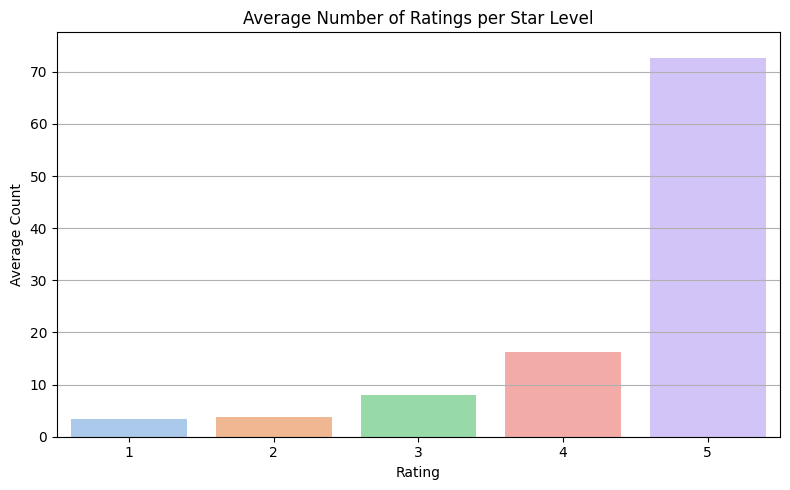

In [26]:
import matplotlib.pyplot as plt
import seaborn as sns

# Calculate mean number of ratings for each star level
rating_means = [df[col].mean() for col in ['star1', 'star2', 'star3', 'star4', 'star5']]
rating_levels = [1, 2, 3, 4, 5]

# Create bar plot
plt.figure(figsize=(8, 5))
sns.barplot(x=rating_levels, y=rating_means, palette='pastel')

# Add titles and labels
plt.title('Average Number of Ratings per Star Level')
plt.xlabel('Rating')
plt.ylabel('Average Count')

# Set axis limits
plt.ylim(0, max(rating_means) + 5)  # Adjust upper limit as needed

# Add grid
plt.grid(axis='y')
plt.show()


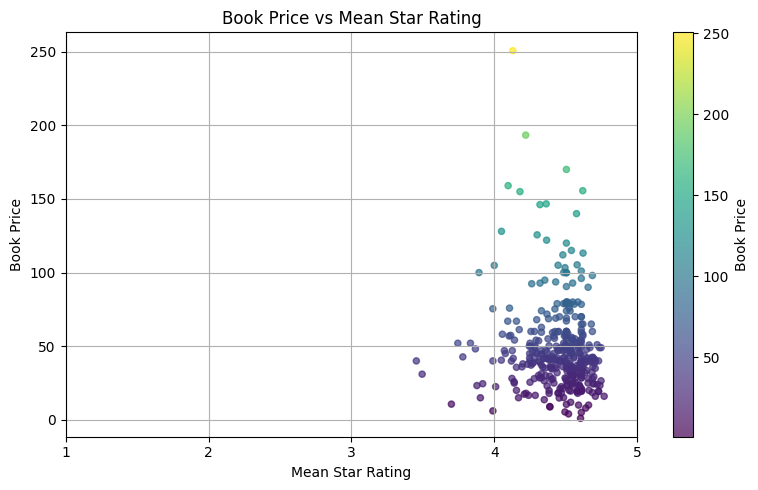

In [27]:
import matplotlib.pyplot as plt
import numpy as np

# Compute the weighted average rating for each book
star_cols = ['star1', 'star2', 'star3', 'star4', 'star5']
weights = np.array([1, 2, 3, 4, 5])
df['mean_rating'] = df[star_cols].values @ weights / df[star_cols].sum(axis=1)

# Create scatter plot with color gradient by price
plt.figure(figsize=(8, 5))
scatter = plt.scatter(df['mean_rating'], df['price'], c=df['price'], cmap='viridis', alpha=0.7, s=20)

# Add color bar for the gradient
cbar = plt.colorbar(scatter)
cbar.set_label('Book Price')

# Add titles and labels
plt.title('Book Price vs Mean Star Rating')
plt.xlabel('Mean Star Rating')
plt.ylabel('Book Price')
plt.xticks([1, 2, 3, 4, 5])

# Add grid
plt.grid(True)
plt.show()


In [28]:
df.sort_values('price', ascending=False)[['title', 'price']].head(10)

,title,price
248,"Statistics, Data Analysis, and Decision Modeling",250.63
242,Data Structures & Algorithm Analysis in C++,193.32
222,Geographic Data Science with Python (Chapman &...,170.00
616,Introduction to Radar With Python and Matlab,159.00
178,Longitudinal Data Analysis,155.57
269,An Introduction to Statistical Methods and Dat...,154.94
337,Statistics and Data Analysis: From Elementary ...,146.65
280,The Analysis of Biological Data,146.12
556,Starting Out with Python,139.99
204,The Statistical Sleuth: A Course in Methods of...,127.98


In [29]:
df.sort_values('pages', ascending=False)[['title', 'pages']].head(10)

,title,pages
630,"Learning Python, 5th Edition",1643.0
442,"Python 3 Standard Library by Example, The (Dev...",1456.0
269,An Introduction to Statistical Methods and Dat...,1296.0
210,"Introduction to Algorithms, 3rd Edition (The M...",1292.0
365,Microsoft Excel Data Analysis and Business Mod...,1168.0
113,Econometric Analysis of Cross Section and Pane...,1096.0
26,"Fluent Python: Clear, Concise, and Effective P...",1012.0
149,Introduction to Statistics and Data Analysis,944.0
321,Data Structures & Algorithms in Python (Develo...,928.0
207,Numerical Methods Using Kotlin: For Data Scien...,921.0


In [30]:
df.sort_values('n_reviews', ascending=False)[['title', 'n_reviews']].head(10)

,title,n_reviews
778,Cracking the Coding Interview: 189 Programming...,7953.0
633,"Python Crash Course, 2nd Edition: A Hands-On, ...",7767.0
394,Python: - The Bible- 3 Manuscripts in 1 book: ...,4228.0
332,Storytelling with Data: A Data Visualization G...,3493.0
181,Designing Data-Intensive Applications: The Big...,3443.0
532,Python: For Beginners: A Crash Course Guide To...,3142.0
659,The Art of Statistics: How to Learn from Data,2906.0
61,"Automate the Boring Stuff with Python, 2nd Edi...",2672.0
32,Python for Everybody: Exploring Data in Python 3,2568.0
210,"Introduction to Algorithms, 3rd Edition (The M...",2240.0


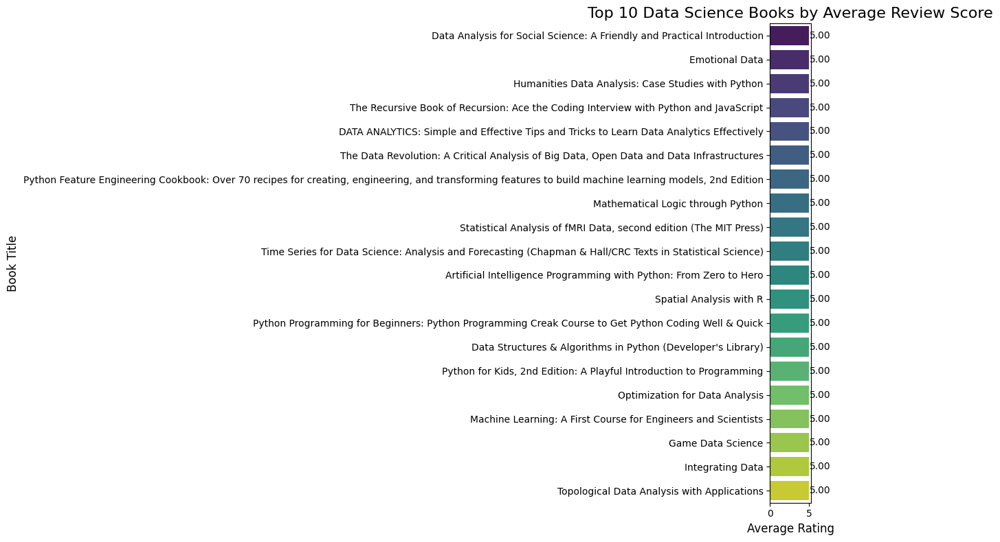

In [31]:
# 6. Plot average reviews
# Create a bar chart for books with highest average reviews
# Taking top 10 books for better visualization
top_books = df.sort_values('avg_reviews', ascending=False).head(20)

plt.figure(figsize=(12, 8))
bar_plot = sns.barplot(x='avg_reviews', y='title', data=top_books, palette='viridis')
plt.title('Top 10 Data Science Books by Average Review Score', fontsize=16)
plt.xlabel('Average Rating', fontsize=12)
plt.ylabel('Book Title', fontsize=12)
plt.tight_layout()
# Add values to the end of each bar
for i, v in enumerate(top_books['avg_reviews']):
    bar_plot.text(v + 0.05, i, f"{v:.2f}", va='center')


# Show the plot
plt.show()

In [32]:
# 1. Which book (title) received max reviews?
max_reviews_book = df.loc[df['n_reviews'].idxmax()]
print("\n1. Book with maximum reviews:")
print(f"Title: {max_reviews_book['title']}")
print(f"Number of reviews: {max_reviews_book['n_reviews']}")


1. Book with maximum reviews:
Title: Cracking the Coding Interview: 189 Programming Questions and Solutions
Number of reviews: 7953.0


In [33]:

# 5. What are the average number of pages in a data science book and the costliest book?
average_no_pages = df['pages'].mean().round()
print('Average pages per book are :',average_no_pages)

Average pages per book are : 437.0


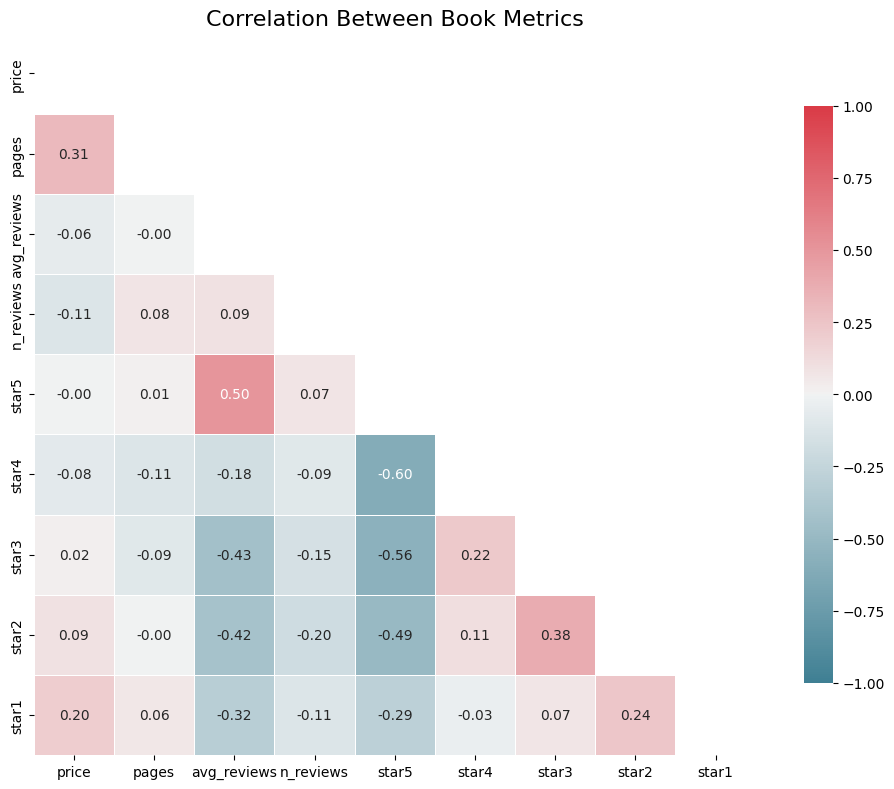

In [34]:
# 1. Correlation heatmap between numerical variables
plt.figure(figsize=(10, 8))
# Select numerical columns
numeric_cols = ['price', 'pages', 'avg_reviews', 'n_reviews', 'star5', 'star4', 'star3', 'star2', 'star1']
correlation = df[numeric_cols].corr()
mask = np.triu(correlation)
cmap = sns.diverging_palette(220, 10, as_cmap=True)
sns.heatmap(correlation, mask=mask, cmap=cmap, vmax=1, vmin=-1, center=0,
            square=True, linewidths=.5, annot=True, fmt='.2f', cbar_kws={"shrink": .8})
plt.title('Correlation Between Book Metrics', fontsize=16)
plt.tight_layout()
plt.savefig('correlation_heatmap.png', dpi=300, bbox_inches='tight')
plt.show()

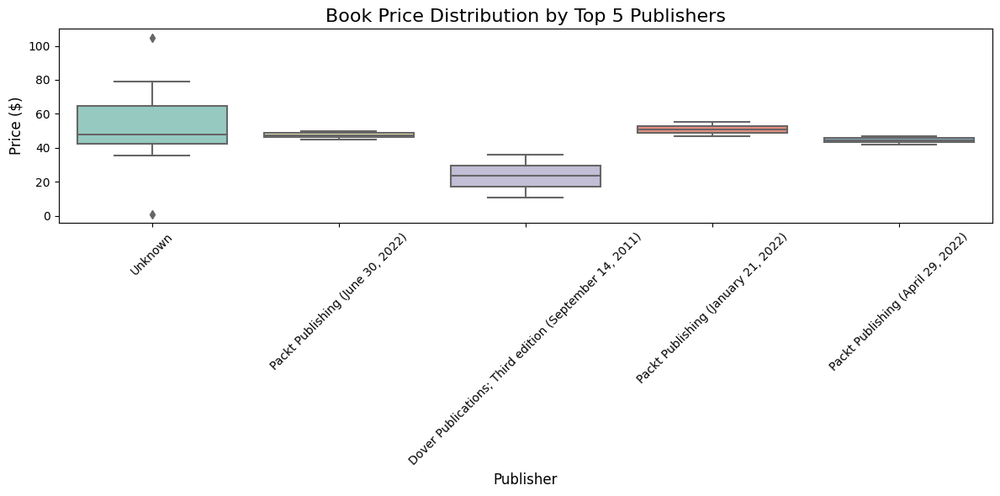

In [35]:
# 2. Box plot of book prices by publisher (top 5 publishers)
top_publishers = df['publisher'].value_counts().nlargest(5).index
publisher_df = df[df['publisher'].isin(top_publishers)]

plt.figure(figsize=(12, 6))
sns.boxplot(x='publisher', y='price', data=publisher_df, palette='Set3')
plt.title('Book Price Distribution by Top 5 Publishers', fontsize=16)
plt.xlabel('Publisher', fontsize=12)
plt.ylabel('Price ($)', fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.savefig('price_by_publisher.png', dpi=300, bbox_inches='tight')
plt.show()

C:\Users\User\AppData\Local\Temp\ipykernel_18124\2111308149.py:25: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  plt.tight_layout()


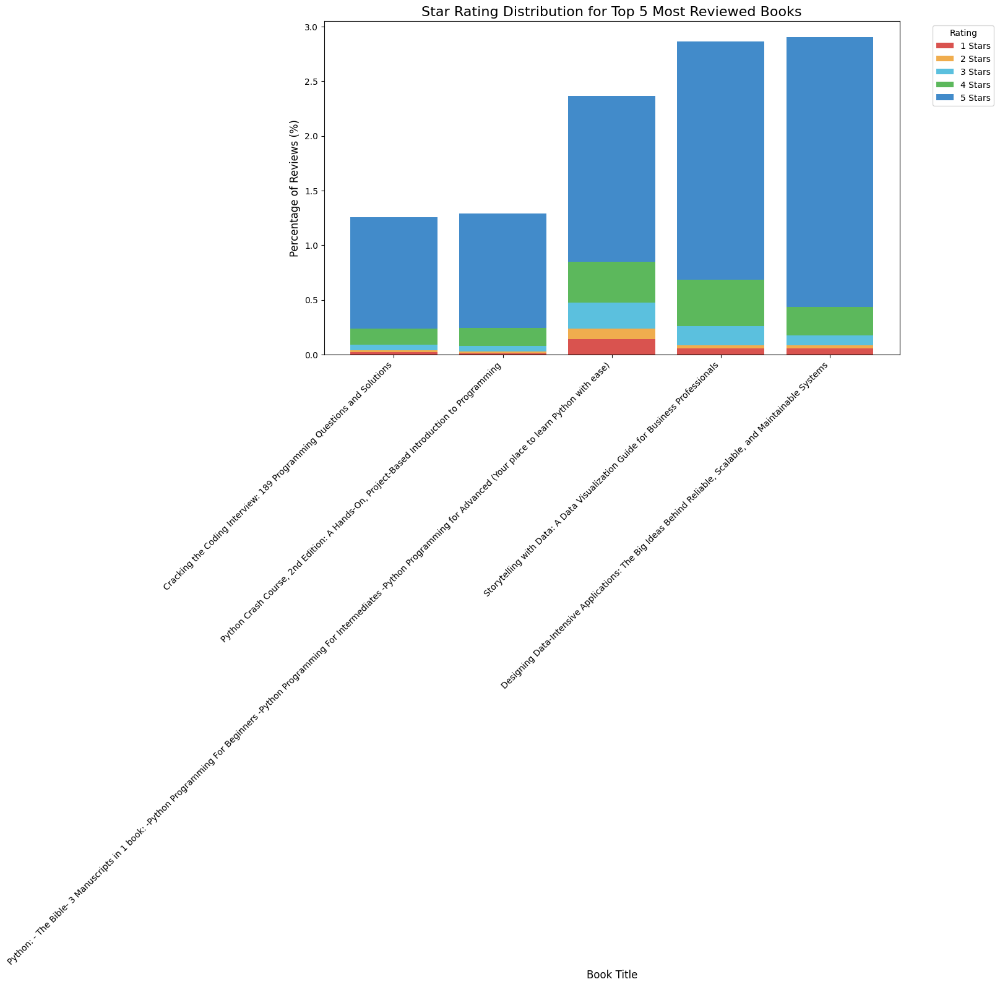

In [36]:
# 3. Stacked bar chart showing distribution of star ratings for top books
top_reviewed_books = df.nlargest(5, 'n_reviews')
star_cols = ['star1', 'star2', 'star3', 'star4', 'star5']

# Calculate percentages
for col in star_cols:
    top_reviewed_books[f'{col}_pct'] = top_reviewed_books[col] / top_reviewed_books['n_reviews'] * 100

plt.figure(figsize=(12, 7))
bar_width = 0.8
colors = ['#d9534f', '#f0ad4e', '#5bc0de', '#5cb85c', '#428bca']  # Red to blue

# Create stacked bars
bottom = np.zeros(len(top_reviewed_books))
for i, col in enumerate(['star1_pct', 'star2_pct', 'star3_pct', 'star4_pct', 'star5_pct']):
    plt.bar(top_reviewed_books['title'], top_reviewed_books[col], 
            bottom=bottom, width=bar_width, label=f"{i+1} Stars", color=colors[i])
    bottom += top_reviewed_books[col]

plt.title('Star Rating Distribution for Top 5 Most Reviewed Books', fontsize=16)
plt.xlabel('Book Title', fontsize=12)
plt.ylabel('Percentage of Reviews (%)', fontsize=12)
plt.legend(title='Rating', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.xticks(rotation=45, ha='right')
plt.tight_layout()
plt.savefig('star_rating_distribution.png', dpi=300, bbox_inches='tight')
plt.show()

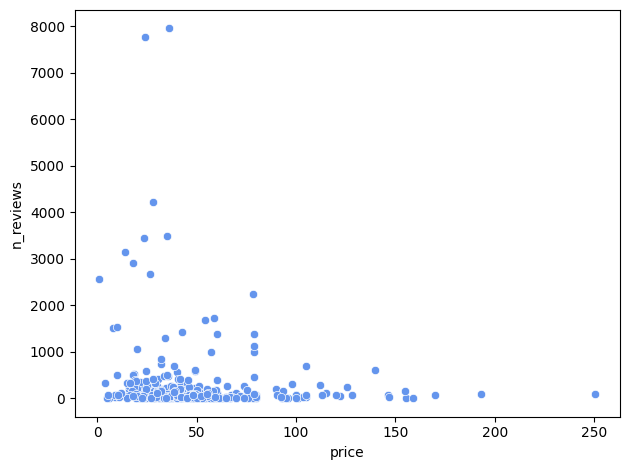

In [37]:
#More expensive books have more reviews?

sns.scatterplot(data=df, x='price',y='n_reviews', color='cornflowerblue');

### Analysis of Book Reviews and Price Correlation

After analyzing the dataset, we observe an interesting trend regarding books with large numbers of reviews. Most of the books with the highest review counts are clustered around the 0 and 100 review range. This suggests that the number of reviews is not strongly influenced by the price of the book, especially for those that are priced higher.

#### Key Insights:
- **Review Distribution**: A significant number of books with high review counts fall within the 0 to 100 review range, indicating that the review count is not necessarily a reliable indicator of book popularity or quality.
  
- **Price vs. Reviews**: Despite common assumptions that more expensive books may accumulate more reviews, this is not supported by the data. In fact, higher-priced books do not consistently correlate with a higher number of reviews. This could imply that the review count is influenced more by factors such as book category, author popularity, and marketing efforts rather than just the price.

#### Conclusion:
We cannot conclusively assume that more expensive books will always have more reviews. Instead, review count should be considered as an independent factor that does not always align with book pricing strategies. This finding helps us adjust expectations when analyzing the relationship between book price and popularity, and highlights the importance of looking at other factors to understand customer engagement better.


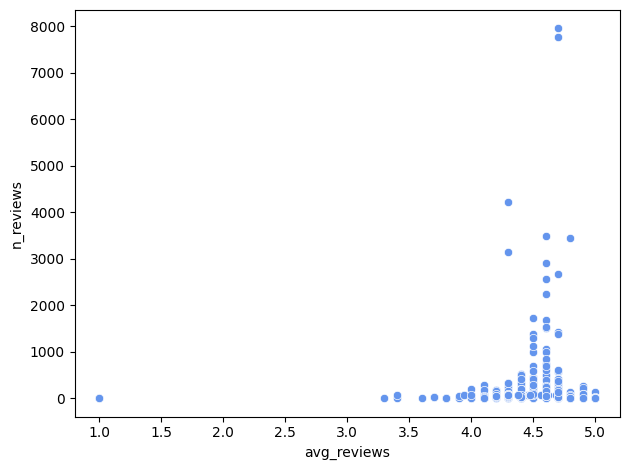

In [38]:
#More reviewed books have higher average ratings?
sns.scatterplot(data=df, x='avg_reviews',y='n_reviews', color='cornflowerblue');


In [39]:
import pandas as pd

# Assuming 'df' is your DataFrame

# Set display option to show full column content (e.g., long book titles)
pd.set_option('display.max_colwidth', True)

# Filter for books with more than 100 reviews and reset index
larger_100_reviews_df = df.query('n_reviews > 100').reset_index(drop=True)

# Sort by n_reviews in descending order, reset index, and select relevant columns
result_df = larger_100_reviews_df.sort_values(by="n_reviews", ascending=False).reset_index(drop=True)[['n_reviews', 'avg_reviews', 'title']]

# Check if 'avg_reviews' column exists, and calculate it if necessary
if 'avg_reviews' not in result_df.columns:
    # Assuming avg_reviews is the average rating per review
    result_df['avg_reviews'] = result_df['n_reviews'] / result_df['n_reviews'].sum()

# Find the minimum avg_reviews
min_avg_reviews = result_df['avg_reviews'].min()

# Display the minimum avg_reviews
print(f"Minimum avg_reviews for books with more than 100 reviews: {min_avg_reviews}")


Minimum avg_reviews for books with more than 100 reviews: 4.0


In [40]:
df.head()

,title,author,price,pages,avg_reviews,n_reviews,star5,star4,star3,star2,star1,dimensions,weight,language,publisher,ISBN_13,link,complete_link,matched_image,mean_rating
2,Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes,"[ Oz du Soleil, and , Bill Jelen]",32.07,274.0,4.7,10.0,87.0,13.0,7.0,3.0,3.0,8.25 x 0.6 x 10.75 inches,1.40,English,"Holy Macro! Books; Third edition (August 1, 2022)",978-1615470747,/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1615470743/ref=sr_1_14?keywords=data+analysis&qid=1671164640&sr=8-14,https://www.amazon.com/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1615470743/ref=sr_1_14?keywords=data+analysis&qid=1671164640&sr=8-14,guerrilla_data_analysis_using_microsoft_excel_overcoming_crap_data_and_excel_skirmishes.jpg,4.575221
3,"Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython",[ William McKinney],53.99,547.0,4.6,1686.0,75.0,16.0,5.0,2.0,2.0,7 x 1.11 x 9.19 inches,1.47,English,"O'Reilly Media; 2nd edition (November 14, 2017)",978-1491957660,/Python-Data-Analysis-Wrangling-IPython/dp/1491957662/ref=sr_1_11?keywords=data+analysis&qid=1671164640&sr=8-11,https://www.amazon.com/Python-Data-Analysis-Wrangling-IPython/dp/1491957662/ref=sr_1_11?keywords=data+analysis&qid=1671164640&sr=8-11,python_for_data_analysis_data_wrangling_with_pandas_numpy_and_ipython.jpg,4.600000
4,Excel Data Analysis For Dummies (For Dummies (Computer/Tech)),[ Paul McFedries],24.49,368.0,3.9,12.0,52.0,17.0,10.0,10.0,10.0,7.38 x 0.83 x 9.25 inches,1.30,English,"For Dummies; 5th edition (February 3, 2022)",978-1119844426,/Excel-Data-Analysis-Dummies-Computer/dp/1119844428/ref=sr_1_12?keywords=data+analysis&qid=1671164640&sr=8-12,https://www.amazon.com/Excel-Data-Analysis-Dummies-Computer/dp/1119844428/ref=sr_1_12?keywords=data+analysis&qid=1671164640&sr=8-12,excel_data_analysis_for_dummies_for_dummies_computertech.jpg,3.919192
6,SQL for Data Analysis: Advanced Techniques for Transforming Data into Insights,[ Cathy Tanimura],40.49,360.0,4.6,72.0,75.0,18.0,2.0,2.0,2.0,6.75 x 0.75 x 8.75 inches,1.20,English,"O'Reilly Media; 1st edition (October 5, 2021)",978-1492088783,/SQL-Data-Analysis-Techniques-Transforming/dp/1492088781/ref=sr_1_9?keywords=data+analysis&qid=1671164640&sr=8-9,https://www.amazon.com/SQL-Data-Analysis-Techniques-Transforming/dp/1492088781/ref=sr_1_9?keywords=data+analysis&qid=1671164640&sr=8-9,sql_for_data_analysis_advanced_techniques_for_transforming_data_into_insights.jpg,4.636364
7,Qualitative Data Analysis: A Methods Sourcebook,"[ Matthew B. Miles, A. Michael Huberman, et al.]",90.00,408.0,4.7,205.0,84.0,9.0,4.0,2.0,3.0,8.5 x 0.92 x 11 inches,2.15,English,"SAGE Publications, Inc; 4th edition (January 22, 2019)",Research in Drama Education,/Qualitative-Data-Analysis-Methods-Sourcebook/dp/150635307X/ref=sr_1_13?keywords=data+analysis&qid=1671164640&sr=8-13,https://www.amazon.com/Qualitative-Data-Analysis-Methods-Sourcebook/dp/150635307X/ref=sr_1_13?keywords=data+analysis&qid=1671164640&sr=8-13,qualitative_data_analysis_a_methods_sourcebook.jpg,4.656863


In [41]:
df.columns

Index(['title', 'author', 'price', 'pages', 'avg_reviews', 'n_reviews',
       'star5', 'star4', 'star3', 'star2', 'star1', 'dimensions', 'weight',
       'language', 'publisher', 'ISBN_13', 'link', 'complete_link',
       'matched_image', 'mean_rating'],
      dtype='object')

# Clustering Books

In [42]:
from sklearn.feature_extraction.text import TfidfVectorizer
import pandas as pd

# Sample dataframe
# df = your DataFrame with the columns 'title' and 'matched_image'

# Initialize TF-IDF Vectorizer
vectorizer = TfidfVectorizer(stop_words='english')

# Fit and transform the 'title' column into a sparse matrix of TF-IDF features
title_features = vectorizer.fit_transform(df['title'])

# Check the shape of the resulting feature matrix
print(title_features.shape)


(373, 767)


1/1 [==============================] - 0s 282ms/step
Missing image file: Book Covers of Amazon Data & AI Books\python_learn_coding_programs_with_python_programming_and_master_data_analysis_and_analytics_data_science_and_machine_learning_with_the_complete_crash_course_for_beginners___5_manuscripts_in_1_book.jpg
1/1 [==============================] - 0s 306ms/step
Missing image file: Book Covers of Amazon Data & AI Books\python___the_bible__3_manuscripts_in_1_book__python_programming_for_beginners__python_programming_for_intermediates__python_programming_for_advanced_your_place_to_learn_python_with_ease.jpg
1/1 [==============================] - 0s 296ms/step
Missing image file: Book Covers of Amazon Data & AI Books\python_crash_course_a_practical_beginners_guide_to_learn_python_in_7_days_or_less_introducing_you_into_the_world_of_data_science_artificial_intelligence_and_machine_learning_with_hands_on_project.jpg
1/1 [==============================] - 0s 292ms/step
Missing image file: Boo

c:\users\user\appdata\local\programs\python\python38\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


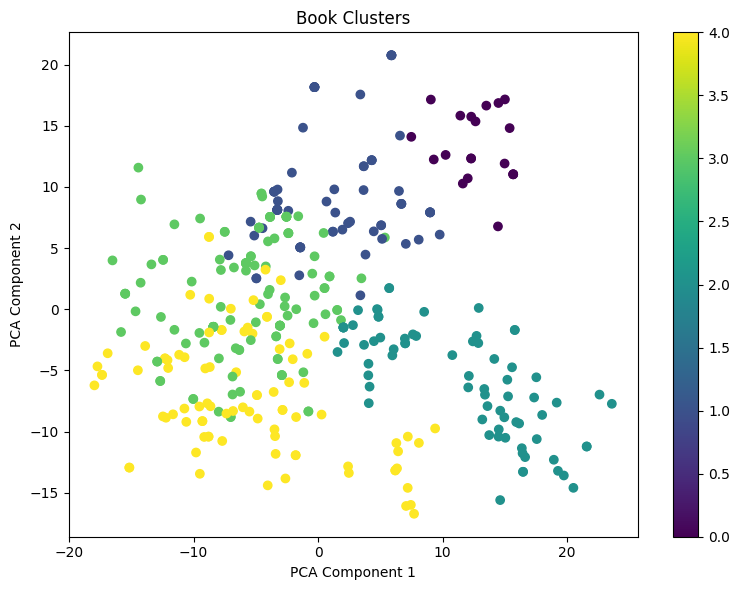

                                                                                      title  \
2  Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes   
3  Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython                   
4  Excel Data Analysis For Dummies (For Dummies (Computer/Tech))                              
6  SQL for Data Analysis: Advanced Techniques for Transforming Data into Insights             
7  Qualitative Data Analysis: A Methods Sourcebook                                            

   cluster  
2  4        
3  2        
4  1        
6  2        
7  2        


In [43]:
import os
import numpy as np
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import ResNet50, preprocess_input
import matplotlib.pyplot as plt
from scipy.sparse import hstack

# Step 1: Assuming df is already defined and contains 'title' and 'matched_image' columns

# Step 2: Extract Features from Book Titles (Textual Data)
vectorizer = TfidfVectorizer(stop_words='english')
title_features = vectorizer.fit_transform(df['title'])

# Step 3: Extract Features from Book Cover Images (Using ResNet50)
model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Function to preprocess images and extract features
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array)

# Path to the directory containing the images
image_directory = 'Book Covers of Amazon Data & AI Books'

# Extract image features for each book
image_features = []
missing_images = []

for img_filename in df['matched_image']:
    img_path = os.path.join(image_directory, img_filename)
    if not os.path.exists(img_path):
        print(f"Missing image file: {img_path}")
        missing_images.append(img_filename)
        image_features.append(np.zeros((2048,)))  # ResNet50 avg pooling output size
        continue
    img_array = preprocess_image(img_path)
    features = model.predict(img_array)
    image_features.append(features.flatten())

# Convert image features into a numpy array
image_features = np.array(image_features)

# Step 4: Combine Title and Image Features
combined_features = hstack([title_features, image_features])

# Step 5: Apply KMeans Clustering
kmeans = KMeans(n_clusters=5, random_state=42)
df['cluster'] = kmeans.fit_predict(combined_features)

# Step 6: Visualize the Clusters Using PCA
pca = PCA(n_components=2)
reduced_features = pca.fit_transform(combined_features.toarray())

# Plot the clusters
plt.figure(figsize=(8, 6))
plt.scatter(reduced_features[:, 0], reduced_features[:, 1], c=df['cluster'], cmap='viridis')
plt.title("Book Clusters")
plt.xlabel("PCA Component 1")
plt.ylabel("PCA Component 2")
plt.colorbar()
plt.show()

# Display the resulting clusters
print(df[['title', 'cluster']].head())


In [44]:
print(os.path.exists('Book Covers of Amazon Data & AI Books'))


True


In [45]:
print(img_path)

Book Covers of Amazon Data & AI Books\ai_and_machine_learning_for_coders_a_programmers_guide_to_artificial_intelligence.jpg


In [46]:
print(df['matched_image'].iloc[0])


guerrilla_data_analysis_using_microsoft_excel_overcoming_crap_data_and_excel_skirmishes.jpg


In [47]:
!pip install wordcloud



[notice] A new release of pip is available: 24.0 -> 25.1.1
[notice] To update, run: python.exe -m pip install --upgrade pip


1/1 [==============================] - 0s 288ms/step
Image not found: Book Covers of Amazon Data & AI Books\python_learn_coding_programs_with_python_programming_and_master_data_analysis_and_analytics_data_science_and_machine_learning_with_the_complete_crash_course_for_beginners___5_manuscripts_in_1_book.jpg
1/1 [==============================] - 0s 294ms/step
Image not found: Book Covers of Amazon Data & AI Books\python___the_bible__3_manuscripts_in_1_book__python_programming_for_beginners__python_programming_for_intermediates__python_programming_for_advanced_your_place_to_learn_python_with_ease.jpg
1/1 [==============================] - 0s 296ms/step
Image not found: Book Covers of Amazon Data & AI Books\python_crash_course_a_practical_beginners_guide_to_learn_python_in_7_days_or_less_introducing_you_into_the_world_of_data_science_artificial_intelligence_and_machine_learning_with_hands_on_project.jpg
1/1 [==============================] - 0s 305ms/step
Image not found: Book Covers of 

c:\users\user\appdata\local\programs\python\python38\lib\site-packages\sklearn\cluster\_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


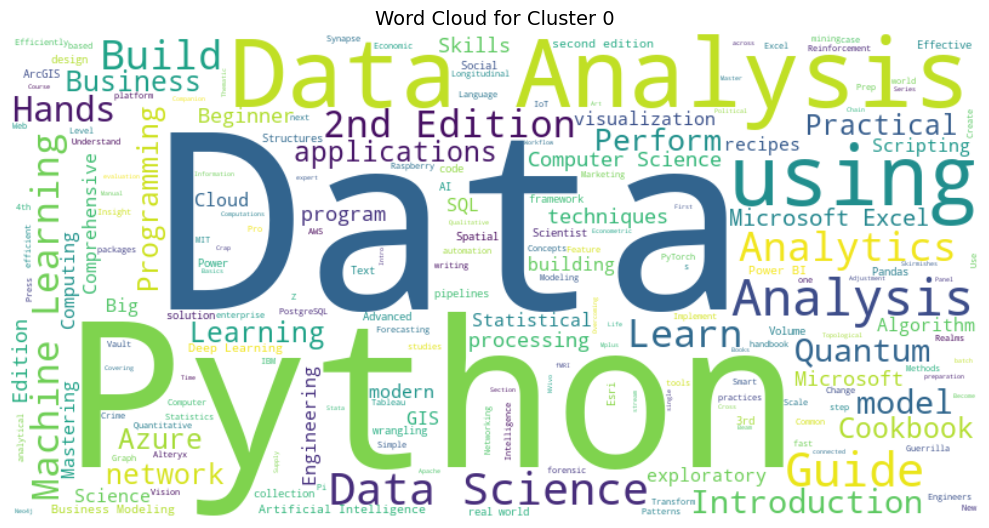

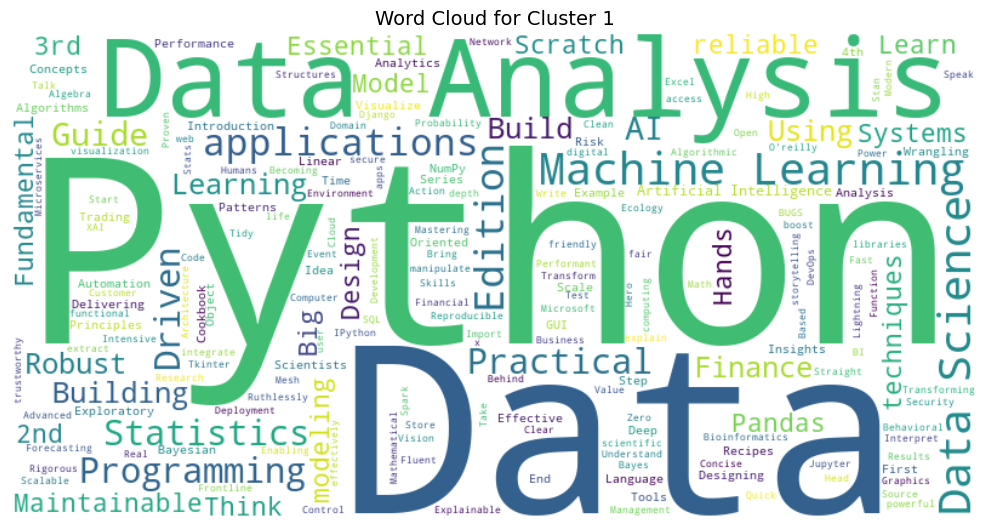

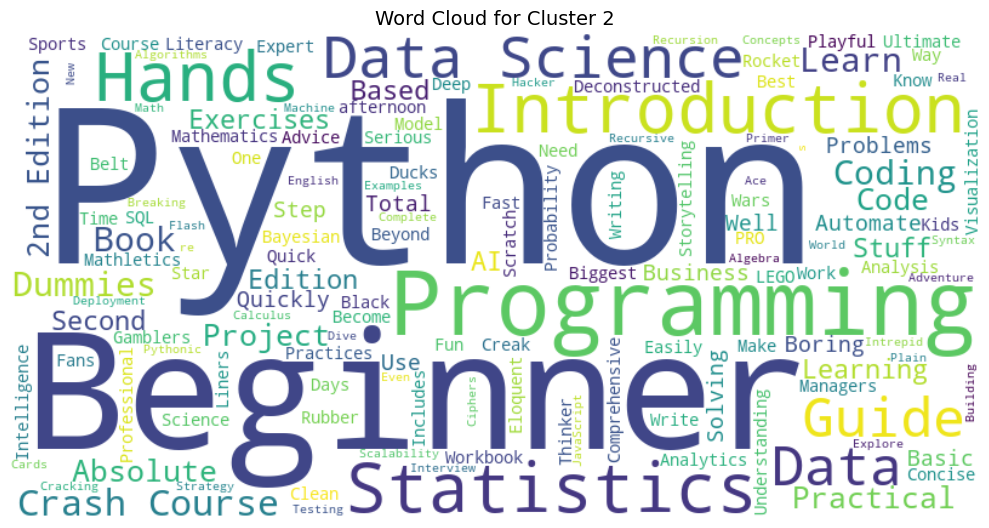

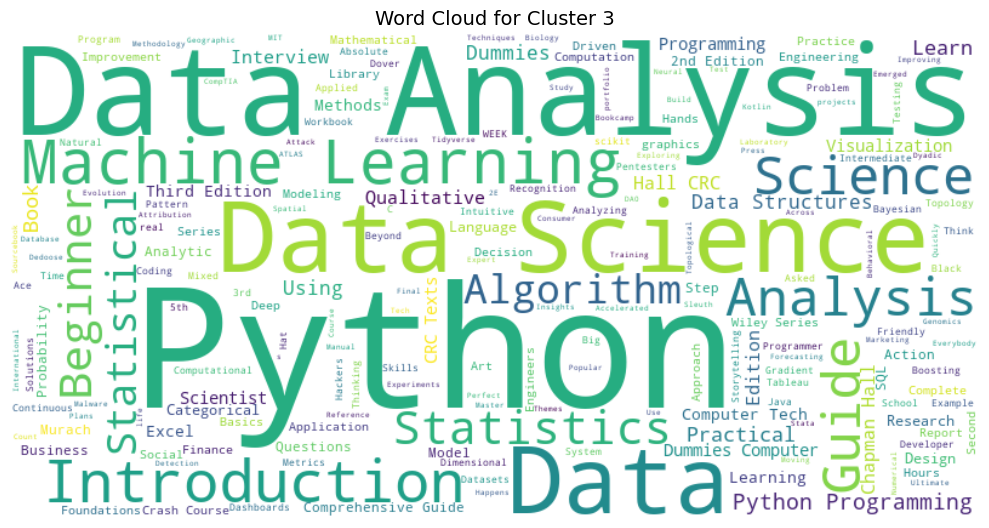

Cluster 0:
                                                                                                                                              title  \
0   Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes                                                          
5   Topological Data Analysis with Applications                                                                                                       
7   SQL for Data Analytics: Perform efficient and fast data analysis with the power of SQL                                                            
10  Data Science for Supply Chain Forecasting                                                                                                         
21  Time Series Analysis with Python Cookbook: Practical recipes for exploratory data analysis, data preparation, forecasting, and model evaluation   

                                                 author  
0   [ Oz du Soleil,  and

In [49]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans
from wordcloud import WordCloud
from keras.applications.resnet50 import ResNet50, preprocess_input
from keras.preprocessing import image
from scipy.sparse import hstack

# Load your DataFrame (you can replace this with your actual CSV or data loading method)
# Example: df = pd.read_csv('books_data.csv')

# Step 1: Extract Features from Book Titles (Textual Data)
vectorizer = TfidfVectorizer(stop_words='english')
title_features = vectorizer.fit_transform(df['title'])

# Step 2: Extract Features from Book Cover Images (Using ResNet50)
model = ResNet50(weights='imagenet', include_top=False, pooling='avg')

# Function to preprocess images
def preprocess_image(img_path):
    img = image.load_img(img_path, target_size=(224, 224))
    img_array = image.img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    return preprocess_input(img_array)

# Directory containing images
image_directory = 'Book Covers of Amazon Data & AI Books'

# Extract image features safely
image_features = []
missing_images = []

for img_filename in df['matched_image']:
    img_path = os.path.join(image_directory, img_filename)
    
    if not os.path.exists(img_path):
        print(f"Image not found: {img_path}")
        missing_images.append(img_filename)
        continue

    try:
        img_array = preprocess_image(img_path)
        features = model.predict(img_array)
        image_features.append(features.flatten())
    except Exception as e:
        print(f"Error processing {img_filename}: {e}")
        missing_images.append(img_filename)

# Drop entries with missing images
df = df[~df['matched_image'].isin(missing_images)].reset_index(drop=True)
image_features = np.array(image_features)

# Step 3: Combine Text and Image Features
combined_features = hstack([title_features[:len(df)], image_features])

# Step 4: KMeans Clustering
kmeans = KMeans(n_clusters=4, random_state=42)
df['cluster'] = kmeans.fit_predict(combined_features)

# Step 5: Generate Word Clouds per Cluster
def generate_wordcloud_for_cluster(cluster_num, df, column='title'):
    cluster_books = df[df['cluster'] == cluster_num]
    text = ' '.join(cluster_books[column])
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster_num}', fontsize=14)
    plt.axis('off')
    plt.show()

# Step 6: Show Word Clouds
for cluster_num in range(4):
    generate_wordcloud_for_cluster(cluster_num, df)

# Step 7: Display Cluster Info
for cluster_num in range(4):
    print(f"Cluster {cluster_num}:")
    print(df[df['cluster'] == cluster_num][['title', 'author']].head(), "\n")


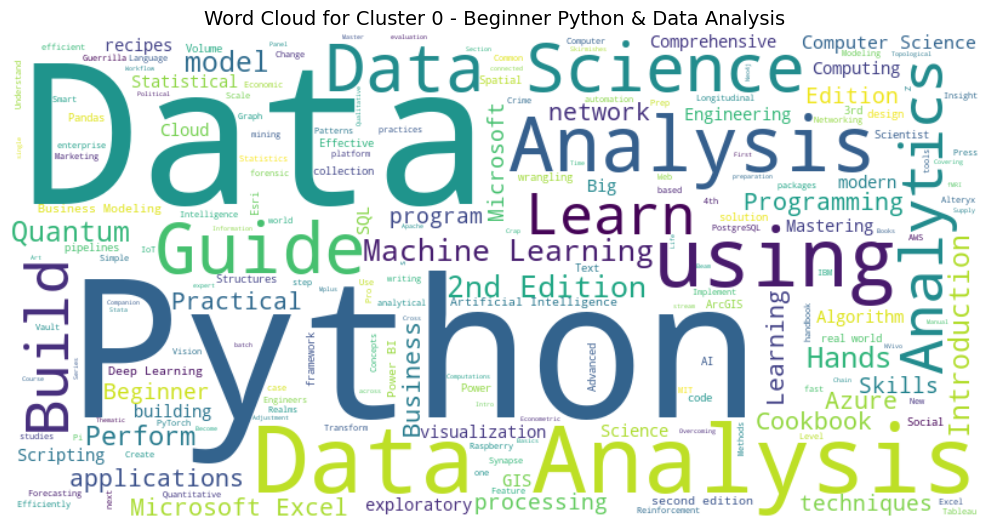

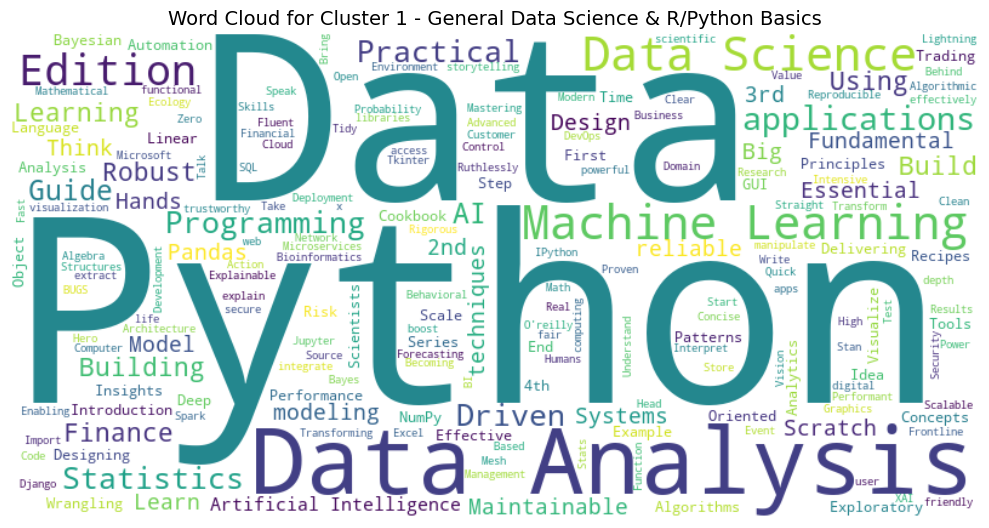

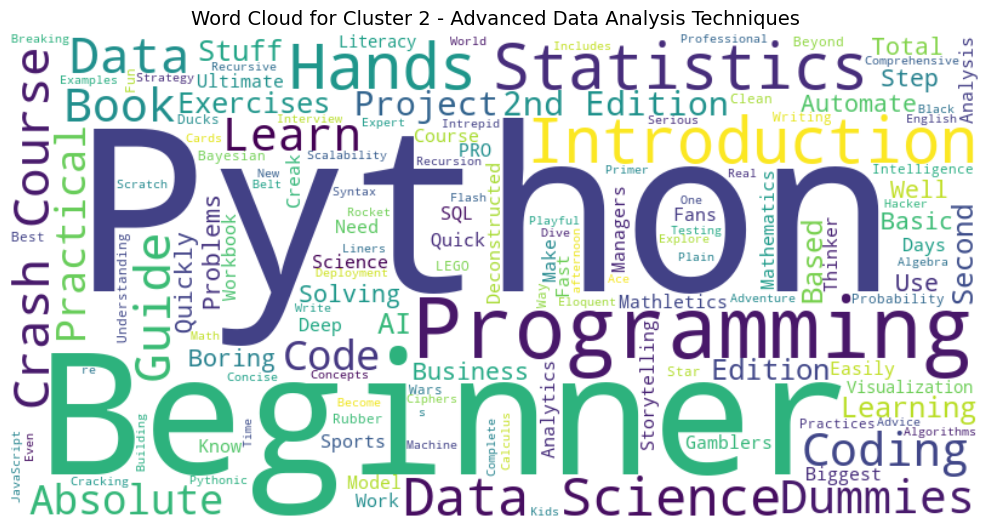

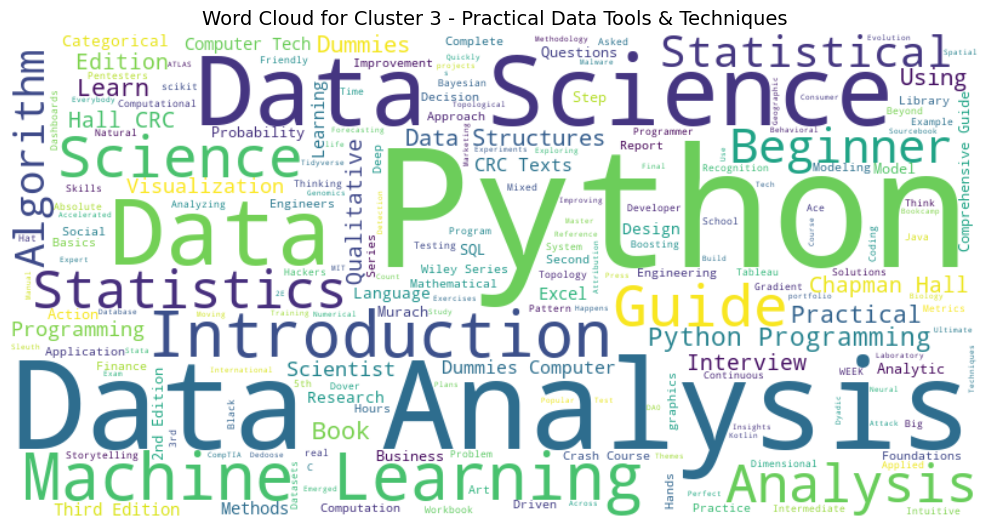

In [50]:


# Step 9: Define the function to convert cluster numbers to names
def convert_clusters(num_of_cluster):
    cluster_names = {
        0: "Beginner Python & Data Analysis",
        1: "General Data Science & R/Python Basics",
        2: "Advanced Data Analysis Techniques",
        3: "Practical Data Tools & Techniques"
    }
    if num_of_cluster in cluster_names:
        return cluster_names[num_of_cluster]
    else:
        return f"Cluster {num_of_cluster} is not defined."

# Step 7: Visualize the Word Cloud for each Cluster
def generate_wordcloud_for_cluster(cluster_num, df, column='title'):
    # Filter books in the given cluster
    cluster_books = df[df['cluster'] == cluster_num]
    
    # Join all titles in the cluster to form a large text
    text = ' '.join(cluster_books[column])
    
    # Generate the word cloud
    wordcloud = WordCloud(width=800, height=400, background_color='white').generate(text)
    
    # Plot the word cloud with the cluster name in the title
    plt.figure(figsize=(10, 6))
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.title(f'Word Cloud for Cluster {cluster_num} - {convert_clusters(cluster_num)}', fontsize=14)
    plt.axis('off')
    plt.show()

# Visualize the word clouds for all clusters
for cluster_num in range(4):  # Adjust for the number of clusters you have
    generate_wordcloud_for_cluster(cluster_num, df)

In [51]:
# Add a new column 'cluster_name' by applying the convert_clusters function
df['cluster_name'] = df['cluster'].apply(convert_clusters)
# Display sample from each named cluster
for name in df['cluster_name'].unique():
    print(f"\n📚 Cluster: {name}")
    print(df[df['cluster_name'] == name][['title', 'author']].head())


📚 Cluster: Beginner Python & Data Analysis
                                                                                                                                              title  \
0   Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes                                                          
5   Topological Data Analysis with Applications                                                                                                       
7   SQL for Data Analytics: Perform efficient and fast data analysis with the power of SQL                                                            
10  Data Science for Supply Chain Forecasting                                                                                                         
21  Time Series Analysis with Python Cookbook: Practical recipes for exploratory data analysis, data preparation, forecasting, and model evaluation   

                                                 


📚 Cluster Name: Beginner Python & Data Analysis
- Showing Top Books Based on Number of Reviews -

📖 Titles in this Cluster:
1. Introduction to Machine Learning with Python: A Guide for Data Scientists — 591.0 reviews
2. A Common-Sense Guide to Data Structures and Algorithms, Second Edition: Level Up Your Core Programming Skills — 570.0 reviews
3. Microsoft Excel 2019 Data Analysis and Business Modeling (Business Skills) — 483.0 reviews
4. Microsoft Excel Data Analysis and Business Modeling (Business Skills) — 423.0 reviews
5. Data Smart: Using Data Science to Transform Information into Insight — 347.0 reviews
6. Intro to Python for Computer Science and Data Science: Learning to Program with AI, Big Data and The Cloud — 297.0 reviews

🖼️ Displaying Book Covers:



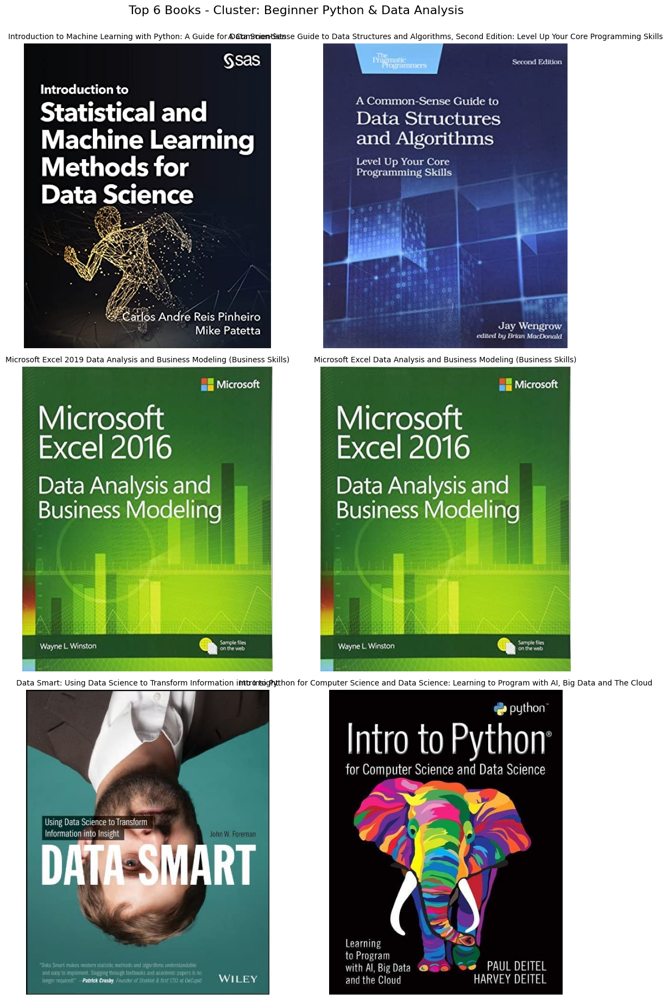


📚 Cluster Name: General Data Science & R/Python Basics
- Showing Top Books Based on Number of Reviews -

📖 Titles in this Cluster:
1. Designing Data-Intensive Applications: The Big Ideas Behind Reliable, Scalable, and Maintainable Systems — 3443.0 reviews
2. Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython — 1686.0 reviews
3. R for Data Science: Import, Tidy, Transform, Visualize, and Model Data — 1426.0 reviews
4. Practical Statistics for Data Scientists: 50+ Essential Concepts Using R and Python — 736.0 reviews
5. Practical Statistics for Data Scientists: 50 Essential Concepts — 402.0 reviews
6. Architecture Patterns with Python: Enabling Test-Driven Development, Domain-Driven Design, and Event-Driven Microservices — 390.0 reviews

🖼️ Displaying Book Covers:



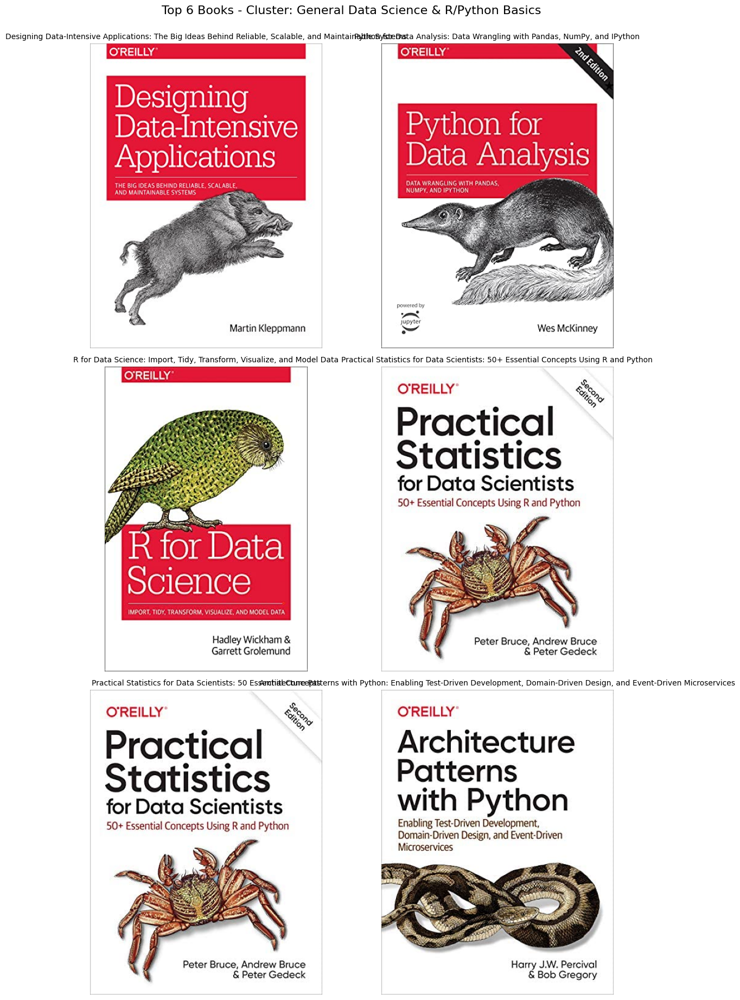


📚 Cluster Name: Practical Data Tools & Techniques
- Showing Top Books Based on Number of Reviews -

📖 Titles in this Cluster:
1. Cracking the Coding Interview: 189 Programming Questions and Solutions — 7953.0 reviews
2. Storytelling with Data: A Data Visualization Guide for Business Professionals — 3493.0 reviews
3. Python: For Beginners: A Crash Course Guide To Learn Python in 1 Week — 3142.0 reviews
4. The Art of Statistics: How to Learn from Data — 2906.0 reviews
5. Python for Everybody: Exploring Data in Python 3 — 2568.0 reviews
6. Introduction to Algorithms, 3rd Edition (The MIT Press) — 2240.0 reviews

🖼️ Displaying Book Covers:



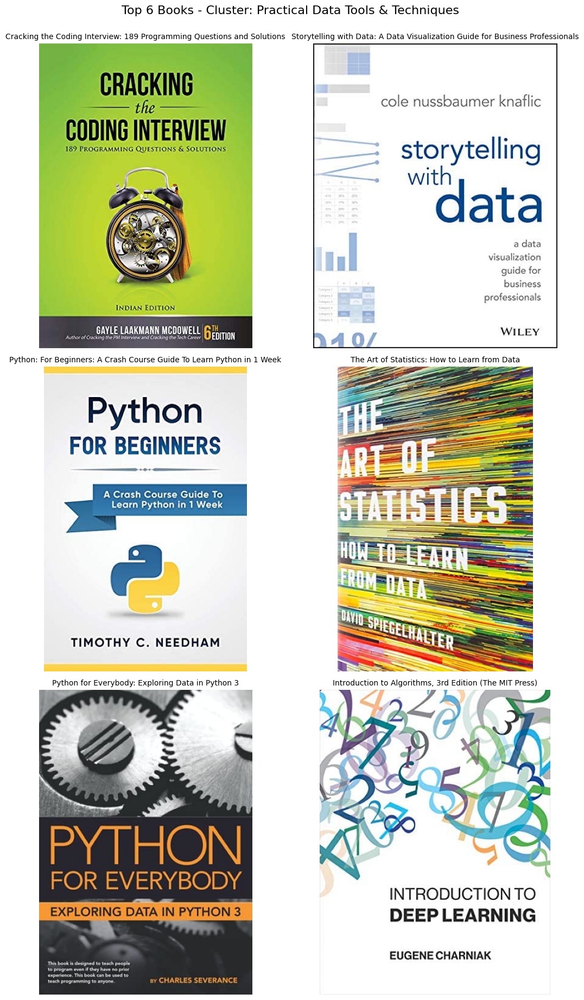


📚 Cluster Name: Advanced Data Analysis Techniques
- Showing Top Books Based on Number of Reviews -

📖 Titles in this Cluster:
1. Python Crash Course, 2nd Edition: A Hands-On, Project-Based Introduction to Programming — 7767.0 reviews
2. Automate the Boring Stuff with Python, 2nd Edition: Practical Programming for Total Beginners — 2672.0 reviews
3. Automate the Boring Stuff with Python: Practical Programming for Total Beginners — 1386.0 reviews
4. Python Crash Course: A Hands-On, Project-Based Introduction to Programming — 1291.0 reviews
5. Machine Learning For Absolute Beginners: A Plain English Introduction (Second Edition) (AI, Data Science, Python & Statistics for Beginners Book 3) — 1123.0 reviews
6. Business Analysis For Dummies — 527.0 reviews

🖼️ Displaying Book Covers:



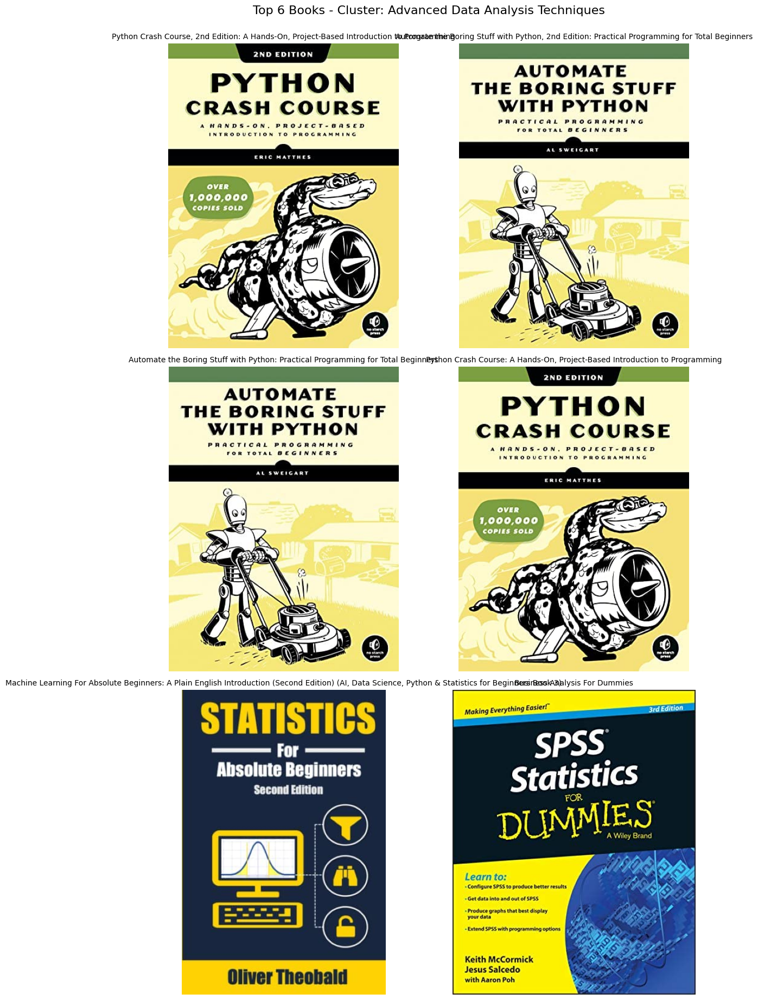

In [52]:
import pandas as pd
import matplotlib.pyplot as plt
import os
from PIL import Image

# Image directory path
image_directory = 'Book Covers of Amazon Data & AI Books'

# Function to show top books in a cluster
def display_top_books_by_cluster_name(cluster_name, df, top_n=6):
    print("="*80)
    print(f"\n📚 Cluster Name: {cluster_name}")
    print("- Showing Top Books Based on Number of Reviews -\n")

    # Filter books belonging to the cluster
    cluster_df = df[df['cluster_name'] == cluster_name]

    if cluster_df.empty:
        print("No books found for this cluster.")
        return

    # Select top_n books sorted by number of reviews
    top_books = cluster_df.sort_values(by='n_reviews', ascending=False).head(top_n)

    # Print the titles first
    print("📖 Titles in this Cluster:")
    for i, (_, row) in enumerate(top_books.iterrows(), 1):
        print(f"{i}. {row['title']} — {row['n_reviews']} reviews")

    print("\n🖼️ Displaying Book Covers:\n")

    # Display corresponding book covers
    n_books = len(top_books)
    cols = 2
    rows = (n_books + cols - 1) // cols

    plt.figure(figsize=(12, 6 * rows))

    for idx, (_, row) in enumerate(top_books.iterrows(), 1):
        plt.subplot(rows, cols, idx)
        img_path = os.path.join(image_directory, row['matched_image'])

        try:
            img = Image.open(img_path)
            plt.imshow(img)
        except FileNotFoundError:
            plt.text(0.5, 0.5, 'Image Not Found', ha='center', va='center')

        plt.axis('off')
        plt.title(row['title'], fontsize=10)

    plt.tight_layout()
    plt.suptitle(f"Top {min(top_n, n_books)} Books - Cluster: {cluster_name}", fontsize=16, y=1.02)
    plt.show()

# Loop through each cluster
unique_cluster_names = df['cluster_name'].unique()

for cluster_name in unique_cluster_names:
    display_top_books_by_cluster_name(cluster_name, df)


c:\users\user\appdata\local\programs\python\python38\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


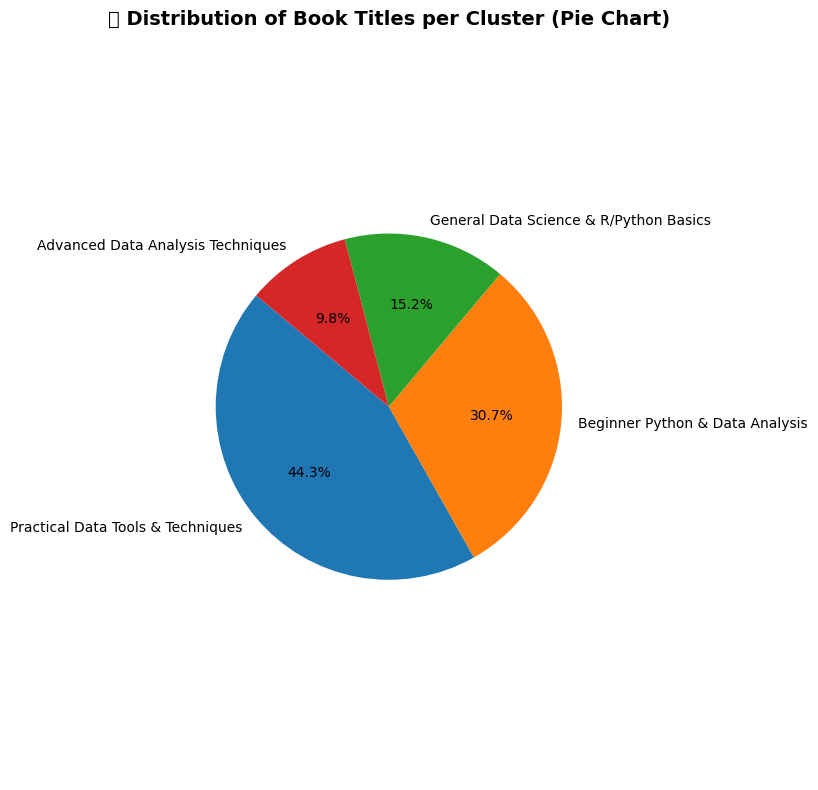

C:\Users\User\AppData\Local\Temp\ipykernel_18124\1429519703.py:21: UserWarning: Glyph 128218 (\N{BOOKS}) missing from current font.
  plt.tight_layout()
c:\users\user\appdata\local\programs\python\python38\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128218 (\N{BOOKS}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


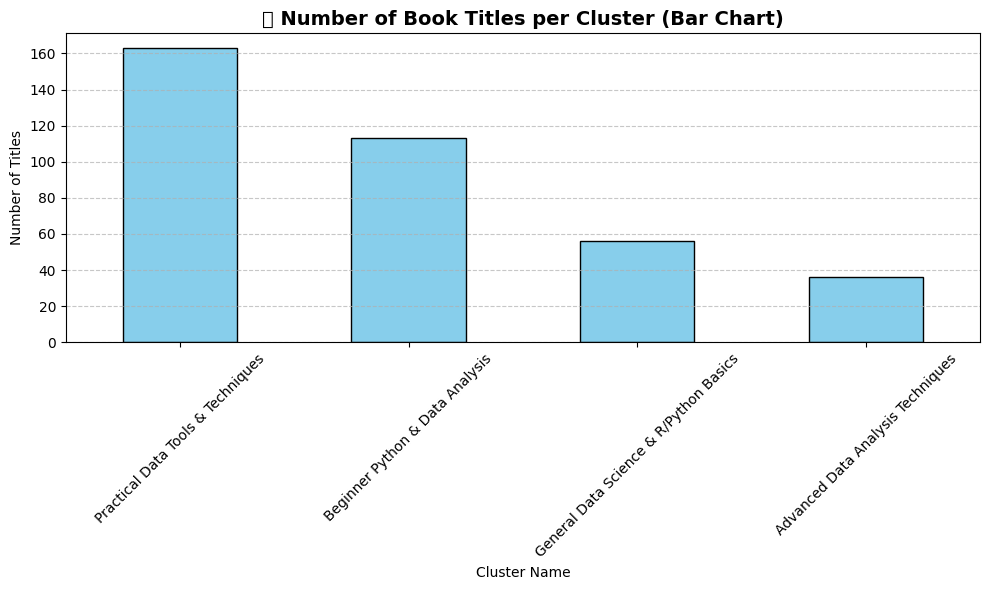

In [53]:
import matplotlib.pyplot as plt

# Count number of books per cluster
cluster_counts = df['cluster_name'].value_counts().sort_values(ascending=False)

# --- Pie Chart ---
plt.figure(figsize=(8, 8))
plt.pie(cluster_counts, labels=cluster_counts.index, autopct='%1.1f%%', startangle=140)
plt.title('📊 Distribution of Book Titles per Cluster (Pie Chart)', fontsize=14, weight='bold')
plt.axis('equal')  # Equal aspect ratio ensures pie is drawn as a circle
plt.show()

# --- Bar Plot ---
plt.figure(figsize=(10, 6))
cluster_counts.plot(kind='bar', color='skyblue', edgecolor='black')
plt.title('📚 Number of Book Titles per Cluster (Bar Chart)', fontsize=14, weight='bold')
plt.xlabel('Cluster Name')
plt.ylabel('Number of Titles')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


📈 Average Price per Cluster:



C:\Users\User\AppData\Local\Temp\ipykernel_18124\4251855536.py:17: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from current font.
  plt.tight_layout()
c:\users\user\appdata\local\programs\python\python38\lib\site-packages\IPython\core\pylabtools.py:152: UserWarning: Glyph 128176 (\N{MONEY BAG}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


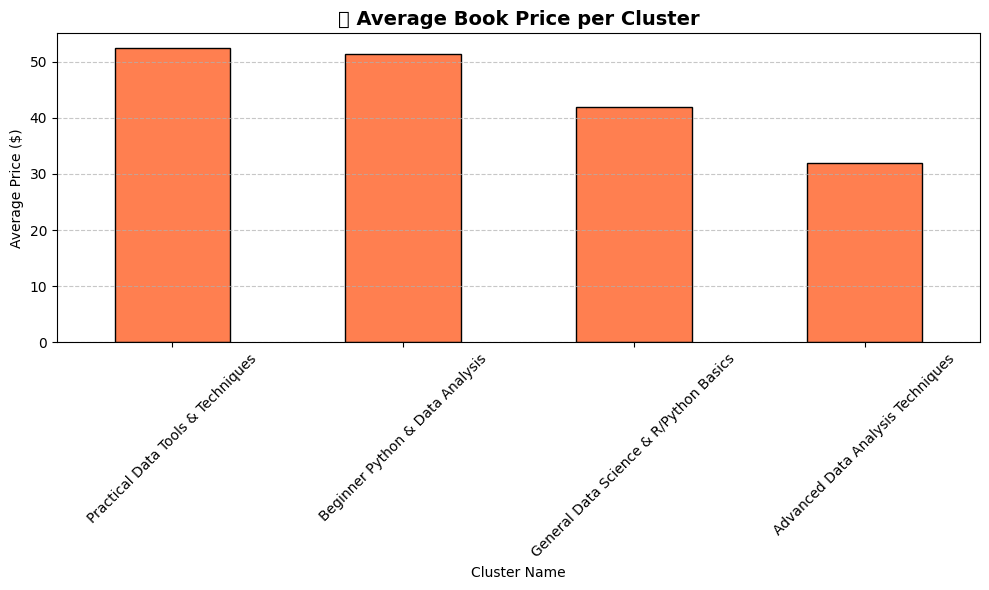

In [54]:
import matplotlib.pyplot as plt

# Calculate average price per cluster
avg_price_per_cluster = df.groupby('cluster_name')['price'].mean().sort_values(ascending=False)

# Display the result
print("📈 Average Price per Cluster:\n")

# Bar Plot to visualize
plt.figure(figsize=(10, 6))
avg_price_per_cluster.plot(kind='bar', color='coral', edgecolor='black')
plt.title('💰 Average Book Price per Cluster', fontsize=14, weight='bold')
plt.xlabel('Cluster Name')
plt.ylabel('Average Price ($)')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()


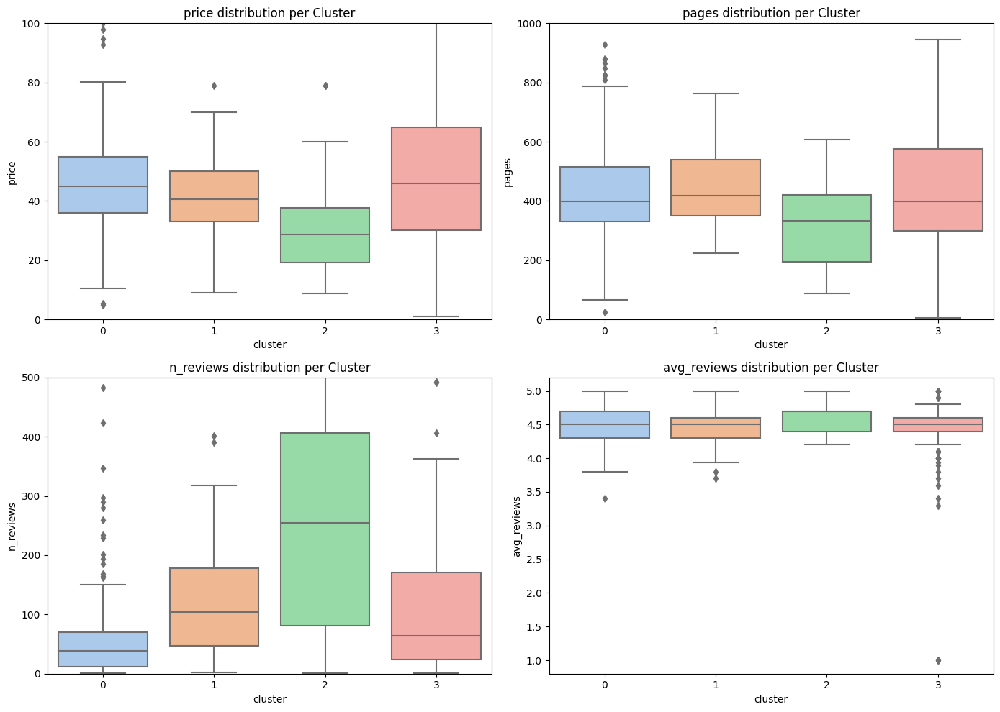

In [55]:
import matplotlib.pyplot as plt
import seaborn as sns

features = ['price', 'pages', 'n_reviews', 'avg_reviews']
max_values = {'price': 100, 'pages': 1000, 'n_reviews': 500, 'avg_reviews': None}  # None means auto-scale

fig, axs = plt.subplots(2, 2, figsize=(14, 10))

for ax, feature in zip(axs.flatten(), features):
    sns.boxplot(data=df, x='cluster', y=feature, ax=ax, palette='pastel')
    ax.set_title(f'{feature} distribution per Cluster')
    if max_values[feature]:
        ax.set_ylim(0, max_values[feature])  # Set y-axis range

plt.tight_layout()
plt.show()


In [56]:
df.head()

,title,author,price,pages,avg_reviews,n_reviews,star5,star4,star3,star2,...,weight,language,publisher,ISBN_13,link,complete_link,matched_image,mean_rating,cluster,cluster_name
0,Guerrilla Data Analysis Using Microsoft Excel: Overcoming Crap Data and Excel Skirmishes,"[ Oz du Soleil, and , Bill Jelen]",32.07,274.0,4.7,10.0,87.0,13.0,7.0,3.0,...,1.40,English,"Holy Macro! Books; Third edition (August 1, 2022)",978-1615470747,/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1615470743/ref=sr_1_14?keywords=data+analysis&qid=1671164640&sr=8-14,https://www.amazon.com/Guerrilla-Analysis-Using-Microsoft-Excel/dp/1615470743/ref=sr_1_14?keywords=data+analysis&qid=1671164640&sr=8-14,guerrilla_data_analysis_using_microsoft_excel_overcoming_crap_data_and_excel_skirmishes.jpg,4.575221,0,Beginner Python & Data Analysis
1,"Python for Data Analysis: Data Wrangling with Pandas, NumPy, and IPython",[ William McKinney],53.99,547.0,4.6,1686.0,75.0,16.0,5.0,2.0,...,1.47,English,"O'Reilly Media; 2nd edition (November 14, 2017)",978-1491957660,/Python-Data-Analysis-Wrangling-IPython/dp/1491957662/ref=sr_1_11?keywords=data+analysis&qid=1671164640&sr=8-11,https://www.amazon.com/Python-Data-Analysis-Wrangling-IPython/dp/1491957662/ref=sr_1_11?keywords=data+analysis&qid=1671164640&sr=8-11,python_for_data_analysis_data_wrangling_with_pandas_numpy_and_ipython.jpg,4.600000,1,General Data Science & R/Python Basics
2,Excel Data Analysis For Dummies (For Dummies (Computer/Tech)),[ Paul McFedries],24.49,368.0,3.9,12.0,52.0,17.0,10.0,10.0,...,1.30,English,"For Dummies; 5th edition (February 3, 2022)",978-1119844426,/Excel-Data-Analysis-Dummies-Computer/dp/1119844428/ref=sr_1_12?keywords=data+analysis&qid=1671164640&sr=8-12,https://www.amazon.com/Excel-Data-Analysis-Dummies-Computer/dp/1119844428/ref=sr_1_12?keywords=data+analysis&qid=1671164640&sr=8-12,excel_data_analysis_for_dummies_for_dummies_computertech.jpg,3.919192,3,Practical Data Tools & Techniques
3,SQL for Data Analysis: Advanced Techniques for Transforming Data into Insights,[ Cathy Tanimura],40.49,360.0,4.6,72.0,75.0,18.0,2.0,2.0,...,1.20,English,"O'Reilly Media; 1st edition (October 5, 2021)",978-1492088783,/SQL-Data-Analysis-Techniques-Transforming/dp/1492088781/ref=sr_1_9?keywords=data+analysis&qid=1671164640&sr=8-9,https://www.amazon.com/SQL-Data-Analysis-Techniques-Transforming/dp/1492088781/ref=sr_1_9?keywords=data+analysis&qid=1671164640&sr=8-9,sql_for_data_analysis_advanced_techniques_for_transforming_data_into_insights.jpg,4.636364,1,General Data Science & R/Python Basics
4,Qualitative Data Analysis: A Methods Sourcebook,"[ Matthew B. Miles, A. Michael Huberman, et al.]",90.00,408.0,4.7,205.0,84.0,9.0,4.0,2.0,...,2.15,English,"SAGE Publications, Inc; 4th edition (January 22, 2019)",Research in Drama Education,/Qualitative-Data-Analysis-Methods-Sourcebook/dp/150635307X/ref=sr_1_13?keywords=data+analysis&qid=1671164640&sr=8-13,https://www.amazon.com/Qualitative-Data-Analysis-Methods-Sourcebook/dp/150635307X/ref=sr_1_13?keywords=data+analysis&qid=1671164640&sr=8-13,qualitative_data_analysis_a_methods_sourcebook.jpg,4.656863,3,Practical Data Tools & Techniques


In [57]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 368 entries, 0 to 367
Data columns (total 22 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   title          368 non-null    object 
 1   author         368 non-null    object 
 2   price          368 non-null    float64
 3   pages          368 non-null    float64
 4   avg_reviews    368 non-null    float64
 5   n_reviews      368 non-null    float64
 6   star5          368 non-null    float64
 7   star4          368 non-null    float64
 8   star3          368 non-null    float64
 9   star2          368 non-null    float64
 10  star1          368 non-null    float64
 11  dimensions     368 non-null    object 
 12  weight         368 non-null    float64
 13  language       368 non-null    object 
 14  publisher      368 non-null    object 
 15  ISBN_13        368 non-null    object 
 16  link           368 non-null    object 
 17  complete_link  368 non-null    object 
 18  matched_im

In [58]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# === 2. Prepare text for search ===
df['search_blob'] = df['title'] + ' ' + df['author'] + ' ' + df['cluster_name']

# === 3. Fit TF-IDF ===
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['search_blob'])

# === 4. User Query (change this as needed) ===
query = "deep learning with python for beginners"  # 🔍 user input

# === 5. Compute Similarity ===
query_vec = vectorizer.transform([query])
similarities = cosine_similarity(query_vec, tfidf_matrix).flatten()
top_indices = similarities.argsort()[-5:][::-1]
top_books = df.iloc[top_indices]

# === 6. Display Results ===
print("📚 Top 5 Matching Books:\n")
for i, row in top_books.iterrows():
    print(f"📖 Title: {row['title']}")
    print(f"✍️  Author: {row['author']}")
    print(f"⭐ Avg Rating: {row['avg_reviews']}")
    print(f"💵 Price: ${row['price']:.2f}")
    print(f"🔗 Link: {row['complete_link']}")
    print("-" * 60)


📚 Top 5 Matching Books:

📖 Title: Python: 3 books in 1- Your complete guide to python programming with Python for Beginners, Python Data Analysis and Python Machine Learning (Programming Languages for Beginners)
✍️  Author: unknown
⭐ Avg Rating: 4.6
💵 Price: $24.95
🔗 Link: https://www.amazon.com/Python-programming-Beginners-Programming-Languages/dp/B09RLRHNGS/ref=sr_1_203?keywords=data+analysis&qid=1671164670&sr=8-203
------------------------------------------------------------
📖 Title: Machine Learning for Absolute Beginners: A Plain English Introduction (Third Edition) (Machine Learning with Python for Beginners Book 1)
✍️  Author: unknown
⭐ Avg Rating: 4.4
💵 Price: $41.72
🔗 Link: https://www.amazon.com/Machine-Learning-Absolute-Beginners-Introduction-ebook/dp/B08RWBSKQB/ref=sr_1_303?crid=1IWIG31DNPO6P&keywords=data+science&qid=1671165079&sprefix=data+science%2Caps%2C586&sr=8-303
------------------------------------------------------------
📖 Title: Deep Learning with Python, Second E

# 📘 Book Recommendation Script Overview

This script takes a dataset of books and allows a user to input a search query (e.g., `"machine learning"`) to find the top n most relevant books based on metadata such as title, author, rating, and more. It uses **TF-IDF vectorization** and **cosine similarity** to rank book relevance.

---


In [61]:
import pandas as pd
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.metrics.pairwise import cosine_similarity


# === 2. Define Meaningful Search Blob ===
def build_blob(row):
    return f"{row['title']} {row['author']} {row['language']} {row['publisher']} " \
           f"{row['cluster_name']} rating {row['avg_reviews']} stars {row['mean_rating']} " \
           f"{int(row['n_reviews'])} reviews priced at ${row['price']:.2f} " \
           f"{int(row['pages'])} pages"

df['search_blob'] = df.apply(build_blob, axis=1)

# === 3. TF-IDF Vectorization ===
vectorizer = TfidfVectorizer(stop_words='english')
tfidf_matrix = vectorizer.fit_transform(df['search_blob'])

# === 4. User Query (Change as needed) ===
query = "statistics "

# === 5. Compute Cosine Similarity ===
query_vec = vectorizer.transform([query])
similarities = cosine_similarity(query_vec, tfidf_matrix).flatten()
top_indices = similarities.argsort()[-5:][::-1]
top_books = df.iloc[top_indices]

# === 6. Display Top 5 Matches ===
print("📚 Top 5 Matching Books:\n")
for _, row in top_books.iterrows():
    print(f"📖 Title: {row['title']}")
    print(f"✍️  Author: {row['author']}")
    print(f"⭐ Avg Rating: {row['avg_reviews']}")
    print(f"💵 Price: ${row['price']:.2f}")
    print(f"📄 Pages: {int(row['pages'])}")
    print(f"🗣️ Language: {row['language']}")
    print(f"🏢 Publisher: {row['publisher']}")
    print(f"📊 Cluster: {row['cluster_name']}")
    print(f"🔗 Link: {row['complete_link']}")
    print("-" * 80)


📚 Top 5 Matching Books:

📖 Title: Statistics for Absolute Beginners (Second Edition) (AI, Data Science, Python & Statistics for Beginners Book 5)
✍️  Author: unknown
⭐ Avg Rating: 4.4
💵 Price: $41.72
📄 Pages: 166
🗣️ Language: English
🏢 Publisher: Scatterplot Press; 2nd edition (February 24, 2020)
📊 Cluster: Advanced Data Analysis Techniques
🔗 Link: https://www.amazon.com/Statistics-Absolute-Beginners-Second-Theobald-ebook/dp/B0854DM1Y7/ref=sr_1_38?crid=1IWIG31DNPO6P&keywords=data+science&qid=1671164641&sprefix=data+science%2Caps%2C586&sr=8-38
--------------------------------------------------------------------------------
📖 Title: Introduction to Statistics: An Intuitive Guide for Analyzing Data and Unlocking Discoveries
✍️  Author: [ Jim Frost]
⭐ Avg Rating: 4.5
💵 Price: $17.99
📄 Pages: 255
🗣️ Language: English
🏢 Publisher: Statistics By Jim Publishing (August 13, 2020)
📊 Cluster: Practical Data Tools & Techniques
🔗 Link: https://www.amazon.com/Introduction-Statistics-Intuitive-Analyz